<div class="alert alert-block alert-info">
<center> <h1> DATA MINING - PROJECT </h1> </center> <br>
<center> <h2> Group 04 </h2> </center> <br>
    <center> <h3> 2024/2025 </h3> </center>

Student Name - Beatriz Monteiro <br>
Student id - 20240591 <br>
Contact e-mail - 20240591@novaims.unl.pt <br>

Student Name - Luís Semedo <br>
Student id - 20240852 <br>
Contact e-mail - 20240852@novaims.unl.pt <br>

Student Name - Pedro Santos <br>
Student id - 20240295 <br>
Contact e-mail - 20240295@novaims.unl.pt <br>

Student Name - Rodrigo Miranda <br>
Student id - 20240490 <br>
Contact e-mail - 20240490@novaims.unl.pt <br>

# Metadata
- *customer_id* - Unique identifier for each customer
- *customer_region* - Geographic region where the customer is located
- *customer_age* - Age of the customer
- *vendor_count* - Number of unique vendors the customer has ordered from
- *product_count* - Total number of products the customer has ordered
- *is_chain* - Indicates whether the customer’s order was from a chain restaurant
- *first_order* - Number of days from the start of the dataset when the customer first placed an order
- *last_order* - Number of days from the start of the dataset when the customer most recently placed an order
- *last_promo* - The category of the promotion or discount most recently used by the customer
- *payment_method* - Method most recently used by the customer to pay for their orders
- *CUI_American,CUI_Asian,CUI_Chinese,CUI_Italian, etc.* - The amount in monetary units spent by the customer from the indicated type of cuisine
- *DOW_0 to DOW_6* - Number of orders placed on each day of the week (0 =Sunday, 6 =Saturday)
- *HR_0 to HR_23* - Number of orders placed during each hour of the day (0 =midnight, 23 = 11 PM)

<a id = "Index"></a>

# Project Index

* [1. Imports](#imports)
   * [1.1. Import Libraries](#importlibraries)
   * [1.2. Import Data](#importdata)
* [2. Exploratory Data Analysis](#exploratorydataanalysis)
   * [2.1 Feature Engineering](#feature-engineering)
   * [2.2. Univariate EDA: Description](#univariate-eda-description)
      * [2.2.1. In-Depth Numerical Analysis](#in-depth-numerical-analysis)
         * [2.2.1.1. Visualization](#2211-visualization)
      * [2.2.2. In-Depth Categorical Analysis](#in-depth-categorical-analysis)
         * [2.2.2.1. Visualization](#2221-visualization)
   * [2.3. Bivariate EDA: Description](#bivariate-eda-description)
      * [2.3.1. Numeric-Numeric: Correlations](#numeric-numeric-correlations)
      * [2.3.2. Numeric-Categorical: Correlations](#numeric-categorical-correlations)
      * [2.3.3. Categorical-Categorical: Cross-tabulations](#categorical-categorical-cross-tabulations)

<hr>
<a class="anchor" id="imports">
    
# 1. Imports

</a>

<a class="anchor" id="importlibraries">

## 1.1.Import Libraries

</a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
%config InlineBackend.figure_format = 'retina'

sns.set()

import warnings
warnings.filterwarnings('ignore')

In [2]:
pd.set_option('display.max_columns', None)

<a class="anchor" id="importdata">

## 1.2.Import Data

</a>

Let's start off by importing our dataset usind read_csv from pandas.

In [3]:
# Opening our dataset
df = pd.read_csv('DM2425_ABCDEats_DATASET.csv')
df

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
0,1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,28.88,0.00,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
1,5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,12.82,6.39,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,9.20,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,0.00,13.70,0.00,0.0,0.0,0.0,0.00,0.0,17.86,0.00,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
4,4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,14.57,40.87,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31883,f4e366c281,8670,30.0,1,1,1,NaN,0,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
31884,f6b6709018,8670,NaN,1,1,0,NaN,0,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
31885,f74ad8ce3f,8670,24.0,1,1,1,NaN,0,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31886,f7b19c0241,8670,34.0,1,1,0,NaN,0,DISCOUNT,DIGI,0.00,12.03,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


In [4]:
# We create a copy to not cause any issues on main dataframe.
df1 = df.copy()

<hr>
<a class="anchor" id = "exploratorydataanalysis">
    
# 2. Exploratory Data Analysis

</a>


Basic structural analysis here:

In [5]:
df1.head()

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
0,1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
1,5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
4,4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [6]:
df1.tail()

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
31883,f4e366c281,8670,30.0,1,1,1,NaN,0,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
31884,f6b6709018,8670,NaN,1,1,0,NaN,0,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
31885,f74ad8ce3f,8670,24.0,1,1,1,NaN,0,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31886,f7b19c0241,8670,34.0,1,1,0,NaN,0,DISCOUNT,DIGI,0.00,12.03,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
31887,fd40d3b0e0,4660,30.0,1,1,0,NaN,0,-,CASH,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,7.91,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [7]:
df1.columns

Index(['customer_id', 'customer_region', 'customer_age', 'vendor_count',
       'product_count', 'is_chain', 'first_order', 'last_order', 'last_promo',
       'payment_method', 'CUI_American', 'CUI_Asian', 'CUI_Beverages',
       'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts',
       'CUI_Healthy', 'CUI_Indian', 'CUI_Italian', 'CUI_Japanese',
       'CUI_Noodle Dishes', 'CUI_OTHER', 'CUI_Street Food / Snacks',
       'CUI_Thai', 'DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5',
       'DOW_6', 'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7',
       'HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15',
       'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23'],
      dtype='object')

In [8]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31888 entries, 0 to 31887
Data columns (total 56 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_id               31888 non-null  object 
 1   customer_region           31888 non-null  object 
 2   customer_age              31161 non-null  float64
 3   vendor_count              31888 non-null  int64  
 4   product_count             31888 non-null  int64  
 5   is_chain                  31888 non-null  int64  
 6   first_order               31782 non-null  float64
 7   last_order                31888 non-null  int64  
 8   last_promo                31888 non-null  object 
 9   payment_method            31888 non-null  object 
 10  CUI_American              31888 non-null  float64
 11  CUI_Asian                 31888 non-null  float64
 12  CUI_Beverages             31888 non-null  float64
 13  CUI_Cafe                  31888 non-null  float64
 14  CUI_Ch

In [9]:
# Gives us a brief statistic summary of only the object data type.
df1.describe(include="object").T

,count,unique,top,freq
customer_id,31888,31875,742ca068fc,2
customer_region,31888,9,8670,9761
last_promo,31888,4,-,16748
payment_method,31888,3,CARD,20161


It seems we could have some duplicate values here in customer_id column. Since the id should be a generically unique number for each customer, it doesnt make sense to have a different count for unique and total values. We will check this in chapter 2.

In [10]:
# Allow us to get the statistical picture of the numeric data.
df1.describe(include=np.number).T

,count,mean,std,min,25%,50%,75%,max
customer_age,31161.0,27.506499,7.160898,15.0,23.0,26.0,31.00,80.00
vendor_count,31888.0,3.102609,2.771587,0.0,1.0,2.0,4.00,41.00
product_count,31888.0,5.668245,6.957287,0.0,2.0,3.0,7.00,269.00
is_chain,31888.0,2.818866,3.977529,0.0,1.0,2.0,3.00,83.00
first_order,31782.0,28.478604,24.109086,0.0,7.0,22.0,45.00,90.00
last_order,31888.0,63.675521,23.226123,0.0,49.0,70.0,83.00,90.00
CUI_American,31888.0,4.880438,11.654018,0.0,0.0,0.0,5.66,280.21
CUI_Asian,31888.0,9.960451,23.564351,0.0,0.0,0.0,11.83,896.71
CUI_Beverages,31888.0,2.300633,8.479734,0.0,0.0,0.0,0.00,229.22
CUI_Cafe,31888.0,0.801163,6.427132,0.0,0.0,0.0,0.00,326.10


Using the information on Metadata, we can have elaborate a preliminary analysis on our data types:

- *customer_id*: Although it could typically be a numeric value, in this case, the IDs contain letters. We could consider setting it as the index, which would reduce the number of columns and provide a unique identifier for each customer.
  
- *customer_region*: Currently, it is categorized as an object, but it should probably be an integer. It appears that the region may represent a zip code or a similar geographic identifier. We should verify these values and assess whether they can be converted to integers or mapped to specific region names. (The data guidelines indicate there are 3 cities, so we need to check if the values correspond correctly.) We have made two assumptions on this variable along the work.

- *customer_age*: The age data appears reasonable but is set as a float, while age is typically represented as an integer. We can address this later. Additionally, there are 727 missing values, which we need to handle.

- *vendor_count*: This represents the number of unique vendors from which a customer has ordered. It’s set as an integer, and everything looks correct here.

- *product_count*: Similar to vendor_count, this seems fine and is appropriately set as an integer. Some incoherences might be present here which we will explain later on.

- *is_chain*: This column indicates whether the customer ordered from a chain restaurant, with values of 1 for True and 0 for False. However, there are some instances of the value 2, which should be investigated. We may need to convert this column to a boolean type after ensuring its accuracy. Assumptions on this variable have been made during the work.

- *first_order*: This represents the number of days from the start of the dataset when the customer placed their first order. Ideally, this should be an integer. There are missing values and some instances where the value is 0, which might indicate that the customer placed an order before the dataset's starting point. If the customer doesn't have a first_order value, they should likely have a last_order value instead. Incoherences present here also, explained later on.

- *last_order*: This is correctly set as an integer, and there are no missing values.

- *last_promo*: Currently set as an object, which is acceptable, but we should review the values. There are some entries with "-" which may need to be replaced with something more meaningful for clarity.

- *payment_method*: This column looks fine but requires a check to confirm that the values are appropriate.

- *CUI's*: Represents the amount spent on specific types of cuisine. These are float values, which seem correct, but we should still review the variables later.

- *DOW's*: This column represents the number of orders placed on each day of the week, with 0 being Sunday and 6 being Saturday. It is an integer, which aligns with the expected format, so no issues here.

- *HR's*: These columns reflect the number of orders placed during each hour of the day. Everything looks fine except for HR0, which should be verified for consistency.

This structured approach ensures that each column is assessed for data type consistency, accuracy, and potential issues that might need to be addressed during cleaning or analysis.



<a class="anchor" id = "feature-engineering">

## 2.1 Feature Engineering

We decided to include feature engineer here for logistic reasons. We only created the features after analysing the data, but including this section at the start gives us the possibility to include these variables on the corresponding sections with the original ones, strenghtening our analysis.

Feature engineering is great for modelling purposes, aggregating some data and analyzing potential new relations between the data is fundamental for some models.
- We have a lot of columns for the "hours" features, which might be interesting to aggregate to analyze some behaviours!

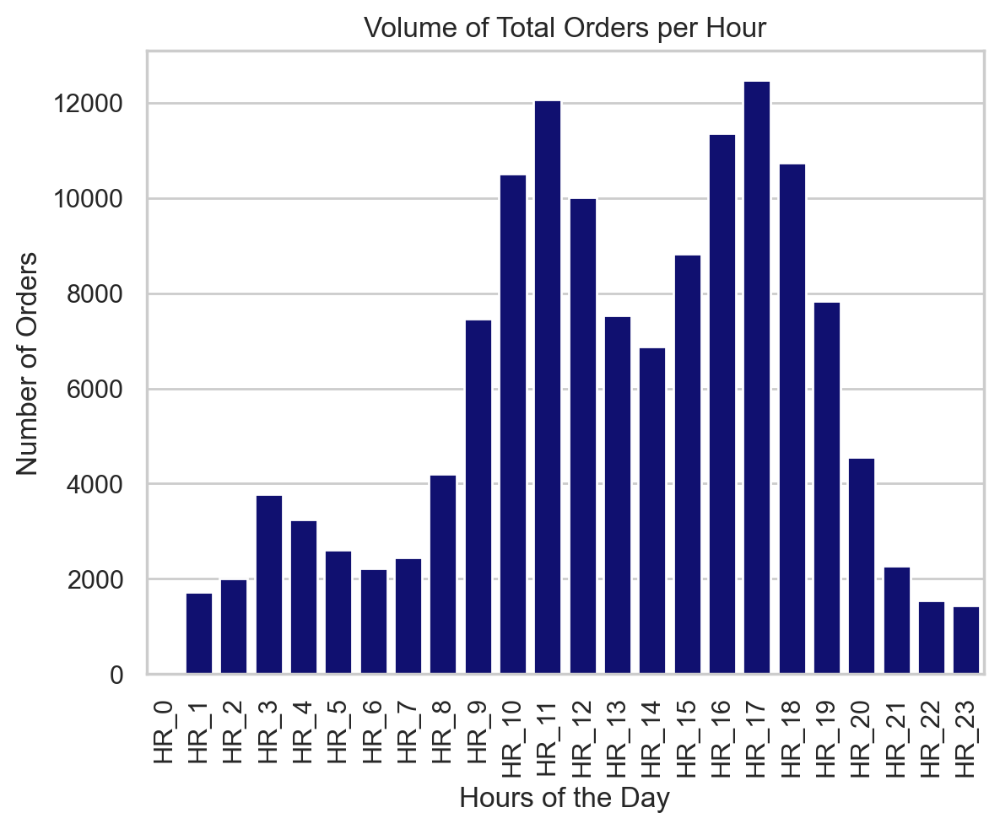

In [11]:
# Checking for volume of total orders per hour:
hourly_totals = df1[['HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23']].sum()

# This is main structure we will use for most barplots and graphical visualizations, pretty standard and simple.

sns.set_style("whitegrid")
sns.barplot(x=hourly_totals.index, y=hourly_totals.values, color="navy")
plt.xticks(rotation=90)
plt.title("Volume of Total Orders per Hour")
plt.xlabel("Hours of the Day")
plt.ylabel("Number of Orders")

plt.show()

It's clear to us now that some hours of the day have much more volume...

#### Peak-Hours and Off-Peak Hours

In [12]:
# From previous graph we can locate hours where volume is predominant
peak_hours = df1["HR_10"] + df1["HR_11"] + df1["HR_12"] + df1["HR_15"] +df1["HR_16"] + df1["HR_17"] + df1["HR_18"]


In [13]:
off_peak_hours = df1["HR_0"] + df1["HR_1"] + df1["HR_2"] + df1["HR_3"] + df1["HR_4"] +df1["HR_5"] + df1["HR_6"] + df1["HR_7"] + df1["HR_8"] + df1["HR_9"] + df1["HR_13"] + df1["HR_14"] + df1["HR_19"] + df1["HR_20"] + df1["HR_21"] + df1["HR_22"] + df1["HR_23"]


In [14]:
df1["peak_hours"] = peak_hours
df1["off_peak_hours"] = off_peak_hours

#### Grouping Hours by meals

In [15]:
# Similarly, we can also aggregate by meal times!

df1['HR_Morning'] = df1[['HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11']].sum(axis=1)
df1['HR_LunchTime'] = df1[['HR_12', 'HR_13', 'HR_14']].sum(axis=1)
df1['HR_Afternoon'] = df1[['HR_15', 'HR_16', 'HR_17','HR_18']].sum(axis=1)
df1['HR_Dinner'] = df1[['HR_19', 'HR_20', 'HR_21', 'HR_22']].sum(axis=1)
df1['HR_Night'] = df1[['HR_23','HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6']].sum(axis=1)
hours_group=['HR_Morning', 'HR_LunchTime', 'HR_Afternoon', 'HR_Dinner', 'HR_Night']

Perhaps it could be interesting to elaborate something with the days of the week as well. Either aggregating by volume or separating the by "Week-end" and "Week-days".


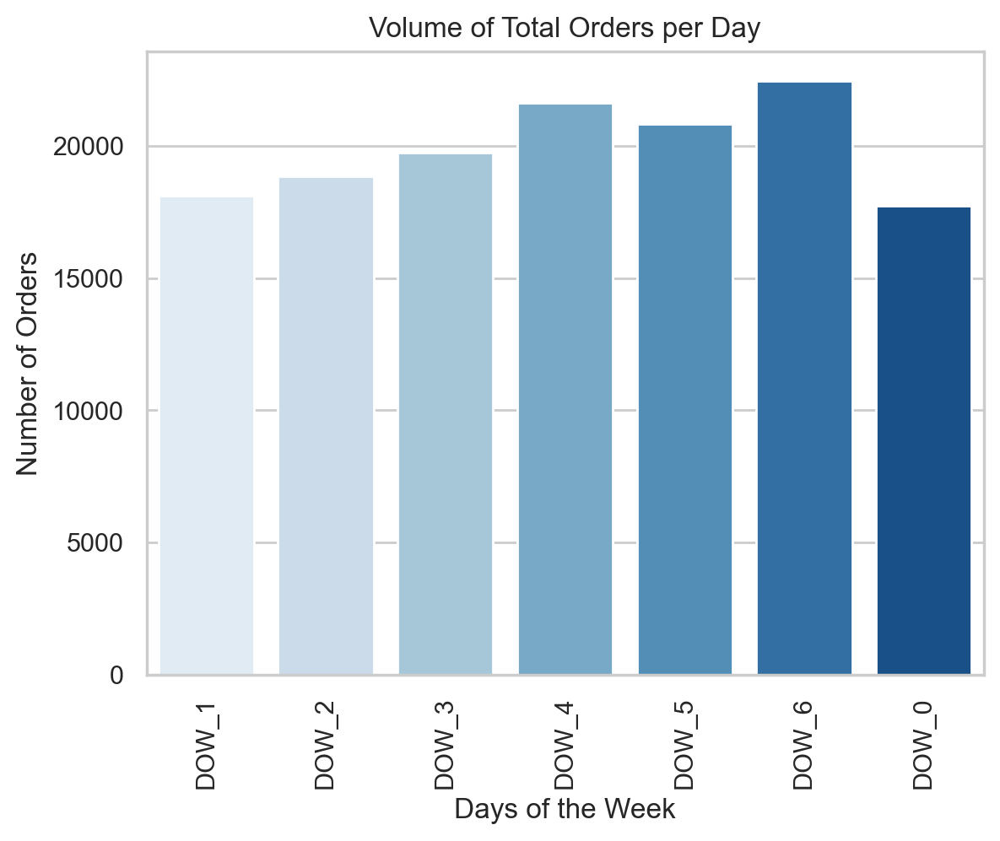

In [16]:
# Checking for volume of total orders per hour:
DoW_totals = df1[['DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'DOW_0']].sum()

# Standard setup for grapphical visualizations:
sns.set_style("whitegrid")
sns.barplot(x=DoW_totals.index, y=DoW_totals.values, palette="Blues")
plt.xticks(rotation=90)
plt.title("Volume of Total Orders per Day")
plt.xlabel("Days of the Week")
plt.ylabel("Number of Orders")

plt.show()

As we can see there is no clear discrepancy between the days of the week... Therefore, we decided not to aggregate these features.

#### Age Groups

Aggregating our Age Feature into Age bins, might prove useful once we are in the modelling stage. It would be useful to remove first the null entires, but nevertheless the idea here remains:
- Might be useful to bin our age feature, so that we can get a better encoding results!


In [17]:
# Binning our ages!

df1['age_group'] = pd.cut(df['customer_age'], bins=[15, 25, 35, 45, 55, 65, 75, 85], labels=["15-25", "26-35", "36-45", "46-55", "56-65", "66-75", "76-85"])

We must be fully aware that we have not yet dealt with NaN entries in our dataset. Future proof checking will need to be done.

#### Promo Usage

We can also create a binary variable which aggregates last_promo. If user has used promo then we set to it to 1, else = 0. This simplifies our variables a bit more and can perhaps capture the essencial relationship we are looking for, which is whether the user used or did not use discount on the last order.

In [18]:
# Defining a binary value
df1['promo_used'] = df1['last_promo'].apply(lambda x: 0 if x == '-' else 1)

#### Total Money Spent

In [19]:
# If we sum all amount spent on each cuisine we can get the total money spent per customer!
CUI = ['CUI_American', 'CUI_Asian', 'CUI_Street Food / Snacks', 'CUI_Italian', 'CUI_OTHER', 'CUI_Japanese', 'CUI_Beverages', 'CUI_Indian',
       'CUI_Chinese', 'CUI_Healthy', 'CUI_Desserts', 'CUI_Thai', 'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Noodle Dishes']

#Total money spent as sum of the cuisines types
df1['Total Money Spent'] = df1[CUI].sum(axis=1)

#### Average money spent per product

In [20]:
# Intuitive process:
df1['avg_spent_per_product'] = df1['Total Money Spent'] / df1['product_count'].replace(0, np.nan)

#### Number of different Cuisines

In [21]:
#number of different CUI
df1['different_CUI'] = 0

# Loop for each row of the dataframe.
for index, row in df1.iterrows():
    count = 0  # Counter for different types of cuisines
    for column in CUI:
        if row[column] > 0:
            count += 1
    # Assigned the counted value to the "different_CUI" column for the current row
    df1.at[index, 'different_CUI'] = count

<a class="anchor" id="univariate-eda-description">

## 2.2. Univariate EDA: Description

Now, we want to set the column 'customer_id' as the index in the dataframes, as this column is supposed to identify an individual. However, first, to ensure we don't lose any important rows due to identifier mistakes, we will check if this column only contains unique values:

In [22]:
unique_IDs = df1['customer_id'].nunique()
total_rows = len(df1)

print(f"The customer_id column has {unique_IDs} unique values,\nand the dataframe df1 has {total_rows} rows.")


The customer_id column has 31875 unique values,
and the dataframe df1 has 31888 rows.


In [23]:
df1[df1.duplicated(subset=['customer_id'], keep=False)]

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,peak_hours,off_peak_hours,HR_Morning,HR_LunchTime,HR_Afternoon,HR_Dinner,HR_Night,age_group,promo_used,Total Money Spent,avg_spent_per_product,different_CUI
3355,b55012ee1c,8550,23.0,4,11,1,2.0,89,FREEBIE,CARD,0.00,93.43,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,3,2,3,1,1,0,0,0.0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10.0,0,0,0,0,10.0,15-25,1,93.43,8.493636,1
3379,b55012ee1c,8550,23.0,4,11,1,2.0,89,FREEBIE,CARD,0.00,93.43,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,3,2,3,1,1,0,0,0.0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10.0,0,0,0,0,10.0,15-25,1,93.43,8.493636,1
7867,24251eb7da,8550,28.0,4,8,3,7.0,85,-,CARD,30.44,18.54,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,32.27,0.0,1,0,3,0,0,0,1,0.0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,2,3.0,0,0,2,0,3.0,26-35,0,81.25,10.156250,3
7887,24251eb7da,8550,28.0,4,8,3,7.0,85,-,CARD,30.44,18.54,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,32.27,0.0,1,0,3,0,0,0,1,0.0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,2,3.0,0,0,2,0,3.0,26-35,0,81.25,10.156250,3
16227,671bf0c738,8550,25.0,4,7,3,23.0,66,FREEBIE,CARD,56.18,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,30.53,0.0,0,1,1,1,0,1,0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,3.0,1,1,1,1,0.0,15-25,1,86.71,12.387143,2
16230,671bf0c738,8550,25.0,4,7,3,23.0,66,FREEBIE,CARD,56.18,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,30.53,0.0,0,1,1,1,0,1,0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,3.0,1,1,1,1,0.0,15-25,1,86.71,12.387143,2
20855,742ca068fc,8550,20.0,1,2,0,35.0,35,-,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,31.57,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0.0,1,0,0,0,0.0,15-25,0,31.57,15.785000,1
20907,742ca068fc,8550,20.0,1,2,0,35.0,35,-,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,31.57,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0.0,1,0,0,0,0.0,15-25,0,31.57,15.785000,1
24328,df91183978,8550,23.0,2,3,1,47.0,52,DELIVERY,CARD,0.00,18.78,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.34,0.0,0,0,1,0,1,0,0,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0,2,0,0,0,0.0,15-25,1,36.12,12.040000,2
24329,df91183978,8550,23.0,2,3,1,47.0,52,DELIVERY,CARD,0.00,18.78,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.34,0.0,0,0,1,0,1,0,0,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0,2,0,0,0,0.0,15-25,1,36.12,12.040000,2


In [24]:
df1.drop_duplicates(subset=['customer_id'], keep='first', inplace=True)
df1

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,peak_hours,off_peak_hours,HR_Morning,HR_LunchTime,HR_Afternoon,HR_Dinner,HR_Night,age_group,promo_used,Total Money Spent,avg_spent_per_product,different_CUI
0,1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,28.88,0.00,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,2,0.0,0,0,2,0,0.0,15-25,1,28.88,5.776,1
1,5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,12.82,6.39,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,2,0.0,2,0,0,0,0.0,15-25,1,19.21,9.605,2
2,f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,9.20,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1.0,2,0,0,0,0.0,36-45,1,9.20,4.600,1
3,180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,0.00,13.70,0.00,0.0,0.0,0.0,0.00,0.0,17.86,0.00,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1.0,1,1,0,0,0.0,NaN,1,31.56,10.520,2
4,4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,14.57,40.87,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0,2,0,0,0,0.0,15-25,0,55.44,11.088,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31883,f4e366c281,8670,30.0,1,1,1,NaN,0,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1.0,0,1,0,0,0.0,26-35,1,18.04,18.040,1
31884,f6b6709018,8670,NaN,1,1,0,NaN,0,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0.0,0,0,1,0,0.0,NaN,1,18.04,18.040,1
31885,f74ad8ce3f,8670,24.0,1,1,1,NaN,0,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,0,0,0,0,1.0,15-25,0,17.79,17.790,1
31886,f7b19c0241,8670,34.0,1,1,0,NaN,0,DISCOUNT,DIGI,0.00,12.03,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0.0,1,0,0,0,0.0,26-35,1,12.03,12.030,1


We can see that the rows with the duplicate IDs have actually the same values in every column as the row of the original ID, so we can set the idex without losing any import info.

In [25]:
# Set customer_id as the index for df1
df1.set_index('customer_id', inplace=True)

For visualization purposes along the work, we can also divide numerical/categorical features.

In [26]:
# We can represent which variables are numeric and which are not.
non_metric_features = df1.select_dtypes(include=["object", "category"])
metric_features = df1.select_dtypes(include = 'number')

#promo_used is a binary feature, so we change its location to the non_metric_features
metric_features = metric_features.drop('promo_used', axis=1)
non_metric_features['promo_used'] = df1['promo_used']

<a class="anchor" id="in-depth-numerical-analysis">

### 2.2.1. In-Depth Numerical Analysis

##### customer_age

In [27]:
# Extract unique values
unique_ages = df1["customer_age"].unique()

# Sort unique values
unique_ages.sort()

print(unique_ages)
print(len(unique_ages)-1)

[15. 16. 17. 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32.
 33. 34. 35. 36. 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50.
 51. 52. 53. 54. 55. 56. 57. 58. 59. 60. 61. 62. 63. 64. 65. 66. 67. 68.
 69. 70. 71. 72. 73. 74. 75. 76. 77. 78. 79. 80. nan]
66


In [28]:
print(f"The number of NaN values in customer_age {df1['customer_age'].isna().sum()}.")

The number of NaN values in customer_age 727.


In [29]:
unique_ages = unique_ages[~np.isnan(unique_ages)]
print(unique_ages)

[15. 16. 17. 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32.
 33. 34. 35. 36. 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50.
 51. 52. 53. 54. 55. 56. 57. 58. 59. 60. 61. 62. 63. 64. 65. 66. 67. 68.
 69. 70. 71. 72. 73. 74. 75. 76. 77. 78. 79. 80.]


In [30]:
# Get the mode (most frequent age)
most_common_age = int(df1['customer_age'].mode()[0])

print(f"The age that most customers have is {most_common_age} years old.")

The age that most customers have is 23 years old.


In [31]:
youngest_age = int(unique_ages.min())
print(f"The youngest customer is {youngest_age} years old.")
oldest_age = int(unique_ages.max())
print(f"The oldest customer is {oldest_age} years old.")

The youngest customer is 15 years old.
The oldest customer is 80 years old.


##### vendor_count and product_count

Potential issues with our age feature: These values should not be floats, this is probably due to the missing data also in our column.
We will see further down the line for which values we could fill these missing values, either the mean of the age or median etc...
- After fixing this issue, we can set customer_age as an integer, since it doesnt make sense to have float numbers, representing the age of our customers.

In [32]:
df.vendor_count.unique() # everything seems fine here.
df.product_count.unique() # Seems fine also.
# We will check for relationships later on. But for an initial preview, the data type seems fine. Analysis for the outliers will come from the boxplots.

array([  5,   2,   3,   4,   6,  10,   8,  17,   7,  26,   9,  32,  15,
        13,  16,  28,  19,  12,  18,  11,  25,  14,  23,  29,  21,  31,
        95,  24,  64,  27,  37,  49,  22,  41,  51,  34,  39,  20,  30,
        47,  40,  53,  38,  54,  35,  33,  56,  65,  45,  63,  36,  79,
        48,  70,  44,  84,  46,  66,  57,  58,  83, 110, 117, 269,  75,
        55,  42,  81,  91,  43,  69,  67,  72,  59,   1,   0,  77,  97,
        87,  73,  76,  60, 109,  52,  62,  94,  80,  89,  61,  82,  50,
        88,  68], dtype=int64)

Possible Error on Data in Product Count:

It appears that we have an incoherence in our dataset. It does not make sense to have customers that have no product_count meaning that they never bought a product but they still appear as valid customers who made an order.

In [33]:
df1[df1['product_count']==0].shape

(156, 67)

##### is_chain

In [34]:
df['is_chain'].value_counts(normalize=True)

is_chain
1     0.268032
0     0.191420
2     0.184803
3     0.115968
4     0.067894
5     0.043276
6     0.029666
7     0.021293
8     0.015680
9     0.011729
10    0.009126
11    0.007777
12    0.005300
13    0.004767
14    0.004328
15    0.002791
16    0.002132
18    0.002038
17    0.001725
19    0.001098
20    0.001066
21    0.000909
22    0.000815
24    0.000721
23    0.000627
26    0.000627
27    0.000502
25    0.000439
28    0.000408
29    0.000314
31    0.000282
30    0.000282
32    0.000251
33    0.000188
34    0.000188
36    0.000157
43    0.000157
40    0.000157
37    0.000125
35    0.000125
45    0.000125
39    0.000063
42    0.000063
48    0.000063
75    0.000031
63    0.000031
54    0.000031
83    0.000031
49    0.000031
46    0.000031
61    0.000031
44    0.000031
67    0.000031
56    0.000031
81    0.000031
73    0.000031
47    0.000031
38    0.000031
65    0.000031
80    0.000031
Name: proportion, dtype: float64

In [35]:
df.is_chain.unique() # this is a bit strange, this variable should categorize either if the order was from a chain restaurant = 1
#or not from a chain restaurant = 0.

array([ 1,  2,  0,  3,  5,  4,  7, 12,  6, 23,  8, 11, 20, 14,  9, 10, 16,
       15, 13, 25, 17, 27, 30, 32, 24, 18, 26, 28, 22, 40, 31, 39, 21, 37,
       19, 33, 65, 38, 29, 45, 47, 73, 81, 56, 35, 46, 67, 44, 61, 34, 36,
       49, 83, 75, 43, 42, 48, 63, 54, 80], dtype=int64)

Definitely will need to check what's going on, perhaps the metadata is exposing wrong information. Is_chain should be a binary variable, sharing information on if an order was from a chain restaurant or not.

**When analyzing this, we see that there is a wide variety of values with significant proportions, meaning it would be strange for there to be so many errors in the date. Therefore, I am more inclined to think that the metadata is incorrect. My suggestion is:**

**is_chain: Number of orders placed from chain restaurant**

**Justification: when analyzing product_count and is_chain, there is a very strong relationship, which makes sense: people with a higher number of orders in chains (note that there may be a high chain value and it could always be the same restaurant) indicate a higher number of products.**


               is_chain  product_count
is_chain       1.000000       0.827071
product_count  0.827071       1.000000


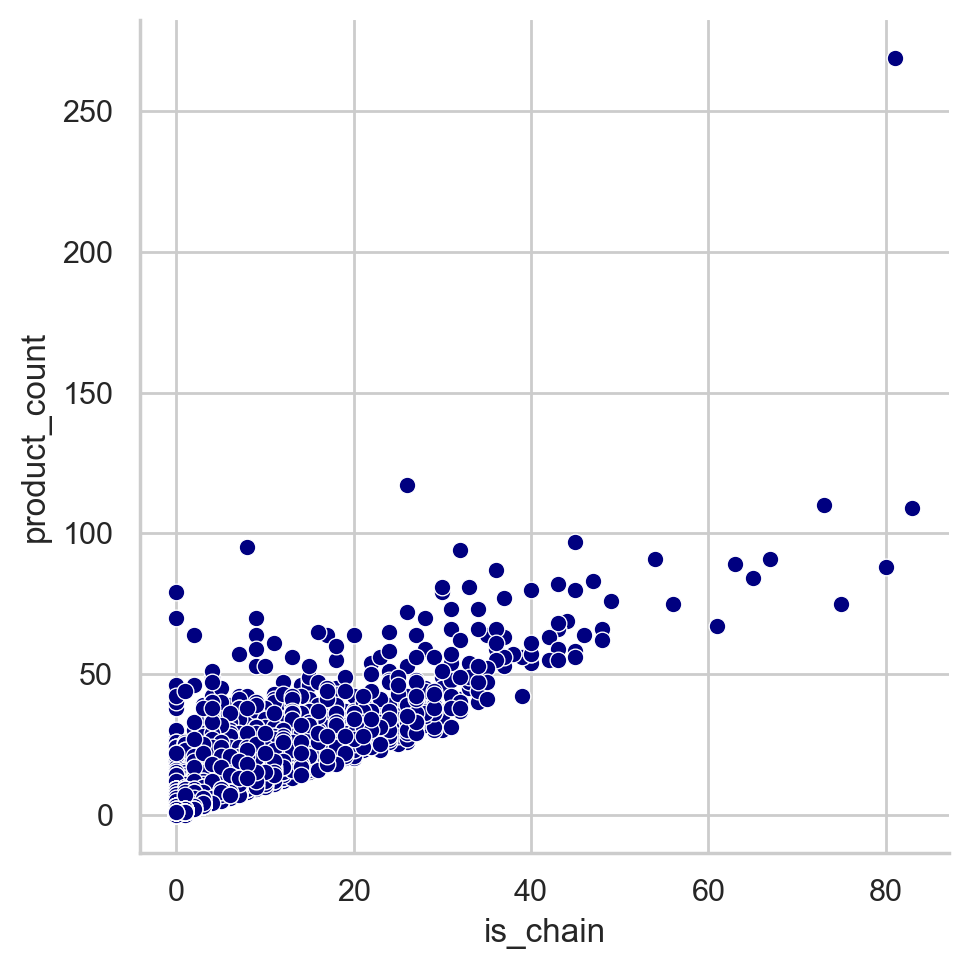

In [36]:
sns.relplot(x='is_chain', y='product_count', data=df, kind='scatter', color="navy")

product_chain_corr = df[['is_chain', 'product_count']].corr()

print(product_chain_corr)

A question may arise: can is_chain not represent the number of different chains? Let's analyze is_chain and vendor_count.

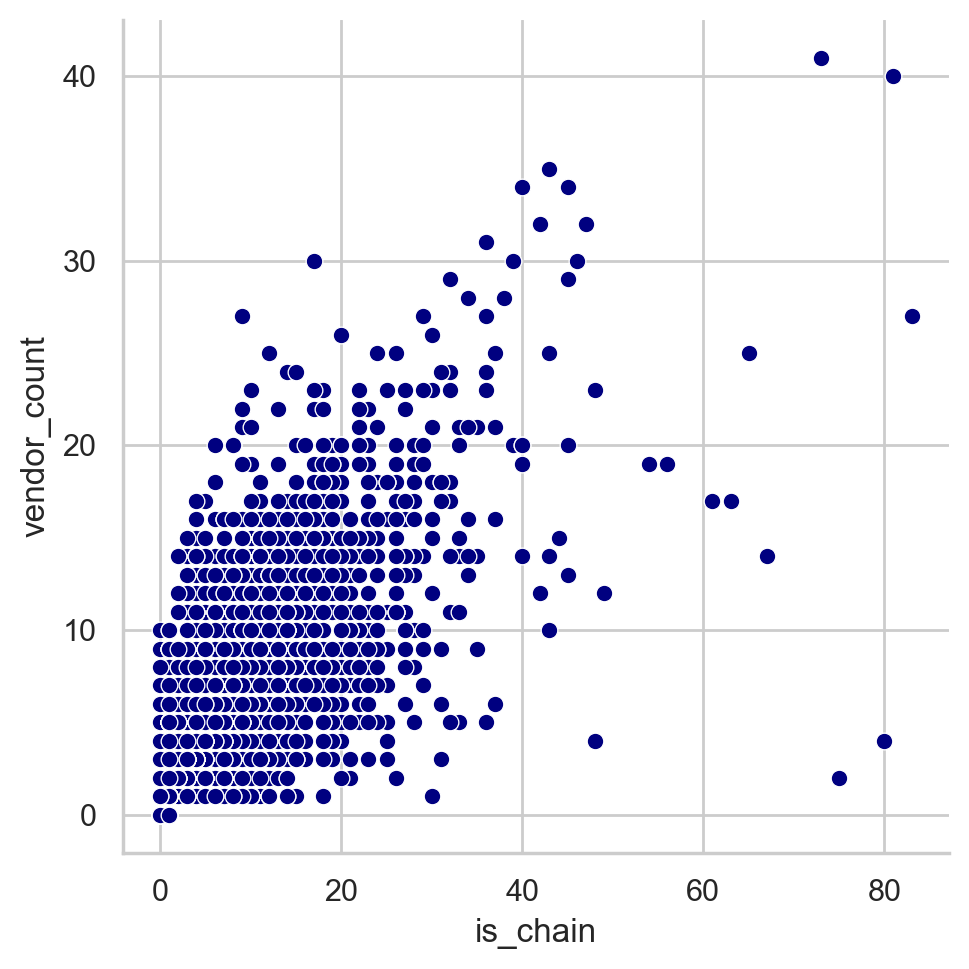

In [37]:
sns.relplot(x='is_chain', y='vendor_count', data=df, kind='scatter', color="navy")

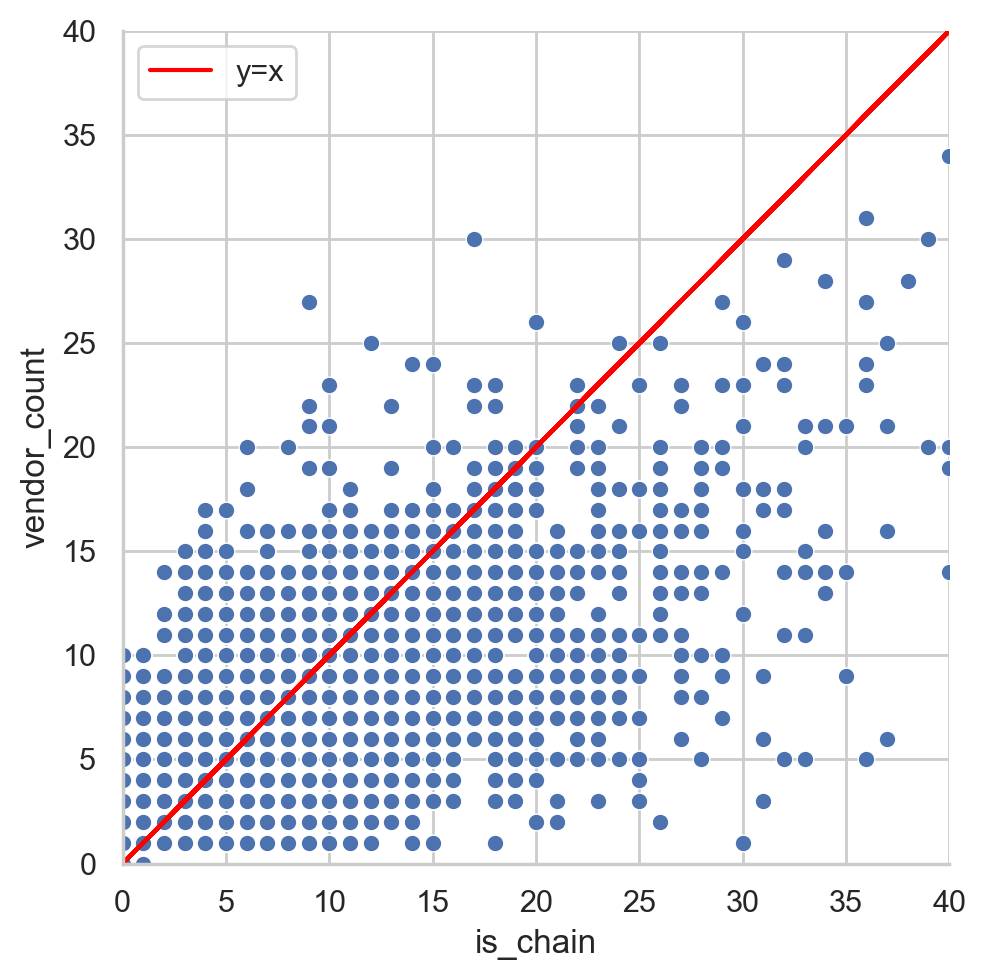

In [38]:
sns.relplot(x='is_chain', y='vendor_count', data=df, kind='scatter')

plt.plot(df['is_chain'], df['is_chain'], color='red', linestyle='-', label='y=x')

# setting limits for our graph
plt.xlim(0, 40)
plt.ylim(0, 40)

# Labels..
plt.xlabel('is_chain')
plt.ylabel('vendor_count')
plt.legend()

plt.show()



**In that case, values like (80, 5) would be impossible, because if there were 80 different chains, there would have to be an equal or greater value for vendor_count.**
<br>
**We can see that all values below y=x would be impossible with this assumption**

<br>

**Let’s analyze possible incongruities, such as is_chain being greater than product_count, which, according to our definition, would be impossible, since is_chain represents the number of orders in chain restaurants.**


In [39]:
check_ischain = df[df['is_chain']>df['product_count']]
check_ischain.shape

(75, 56)

We noticed that there are 75 missing values.

In [40]:
check_ischain['product_count'].value_counts()

product_count
0    75
Name: count, dtype: int64

**But we also realized that all the missing values correspond to product_count = 0, which by itself seems like erroneous data. Why would there be registered customers with product_count = 0?**

#### first_order and last_order

In [41]:
df1["first_order"].value_counts()

first_order
0.0     1436
1.0     1011
6.0      997
2.0      934
3.0      934
        ... 
78.0     101
85.0      90
86.0      90
87.0      90
90.0       1
Name: count, Length: 91, dtype: int64

In [42]:
df1["first_order"].unique()
# Missing values present

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
       26., 27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38.,
       39., 40., 41., 42., 43., 44., 45., 46., 47., 48., 49., 50., 51.,
       52., 53., 54., 55., 56., 57., 58., 59., 60., 61., 62., 63., 64.,
       65., 66., 67., 68., 69., 70., 71., 72., 73., 74., 75., 76., 77.,
       78., 79., 80., 81., 82., 83., 84., 85., 86., 87., 88., 89., 90.,
       nan])

In [43]:
df1["first_order"].isna().sum()

106

In [44]:
### What is average first order days?
df1["first_order"].mean()
# So in our business, since the start of the dataset, customers placed their first order in 28 days time.

28.46992351034027

In [45]:
df1["last_order"].unique()
# We have a few customer that have not yet placed an order since the start of dataset.

array([ 1,  2,  3,  4,  5,  6,  7,  8, 10, 11, 12, 13, 14, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
       37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
       71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87,
       88, 89, 90,  9, 15,  0], dtype=int64)

In [46]:
df1["last_order"].mean()
# Recency of a last_order of 63 days... Seems a lot for a business to have such a gap in orders placed.

63.67237647058823

In [47]:
df1[df1["last_order"] == 0]
# 106 customers have not yet placed an order since the start with dataset, but as we can see it seems that we also do not have values for first_order.

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,peak_hours,off_peak_hours,HR_Morning,HR_LunchTime,HR_Afternoon,HR_Dinner,HR_Night,age_group,promo_used,Total Money Spent,avg_spent_per_product,different_CUI
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0366fbb035,8670,24.0,1,1,0,NaN,0,-,DIGI,0.00,11.87,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,1,0,0,0,0.0,15-25,0,11.87,11.87,1
039d7c8a20,4660,23.0,1,1,0,NaN,0,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,14.49,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0.0,0,0,1,0,0.0,15-25,1,14.49,14.49,1
04c9d25c93,8670,27.0,1,1,1,NaN,0,DISCOUNT,CASH,18.16,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,1,0,0,0,0.0,26-35,1,18.16,18.16,1
09118ae9e7,8670,36.0,1,1,0,NaN,0,-,CARD,0.00,6.02,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0.0,0,1,0,0,0.0,36-45,0,6.02,6.02,1
0d1f298bbd,4660,22.0,1,1,1,NaN,0,DISCOUNT,CASH,5.22,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1.0,0,1,0,0,0.0,15-25,1,5.22,5.22,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
f4e366c281,8670,30.0,1,1,1,NaN,0,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1.0,0,1,0,0,0.0,26-35,1,18.04,18.04,1
f6b6709018,8670,NaN,1,1,0,NaN,0,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0.0,0,0,1,0,0.0,NaN,1,18.04,18.04,1
f74ad8ce3f,8670,24.0,1,1,1,NaN,0,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,0,0,0,0,1.0,15-25,0,17.79,17.79,1


In [48]:
condition = (df1["last_order"] == 0) & (pd.isna(df1["first_order"]))
df1[condition]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,peak_hours,off_peak_hours,HR_Morning,HR_LunchTime,HR_Afternoon,HR_Dinner,HR_Night,age_group,promo_used,Total Money Spent,avg_spent_per_product,different_CUI
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0366fbb035,8670,24.0,1,1,0,NaN,0,-,DIGI,0.00,11.87,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,1,0,0,0,0.0,15-25,0,11.87,11.87,1
039d7c8a20,4660,23.0,1,1,0,NaN,0,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,14.49,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0.0,0,0,1,0,0.0,15-25,1,14.49,14.49,1
04c9d25c93,8670,27.0,1,1,1,NaN,0,DISCOUNT,CASH,18.16,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,1,0,0,0,0.0,26-35,1,18.16,18.16,1
09118ae9e7,8670,36.0,1,1,0,NaN,0,-,CARD,0.00,6.02,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0.0,0,1,0,0,0.0,36-45,0,6.02,6.02,1
0d1f298bbd,4660,22.0,1,1,1,NaN,0,DISCOUNT,CASH,5.22,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1.0,0,1,0,0,0.0,15-25,1,5.22,5.22,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
f4e366c281,8670,30.0,1,1,1,NaN,0,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1.0,0,1,0,0,0.0,26-35,1,18.04,18.04,1
f6b6709018,8670,NaN,1,1,0,NaN,0,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0.0,0,0,1,0,0.0,NaN,1,18.04,18.04,1
f74ad8ce3f,8670,24.0,1,1,1,NaN,0,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,0,0,0,0,1.0,15-25,0,17.79,17.79,1


This seems to be an incoherence of some sorts... 106 people that since the start of the dataset have no orders placed yet, we have a register for orders placed and amount spent on cuisines. Also product_count and vendor count = 1 in some cases.
 - We know that first_order has 106 nans, and it seems that they are all associated with a last_order of zero.


#### Cuisines

In [49]:
for column in df.columns[df.columns.str.contains("CUI")]:
    print(f"Value counts for column: {column}")
    print(df[column].value_counts())
    print()

Value counts for column: CUI_American
CUI_American
0.00     21093
5.98        57
5.90        43
6.26        37
6.34        34
         ...  
24.31        1
22.81        1
49.24        1
34.46        1
8.65         1
Name: count, Length: 3327, dtype: int64

Value counts for column: CUI_Asian
CUI_Asian
0.00     19983
5.90        33
6.06        26
5.96        23
12.08       21
         ...  
28.59        1
26.62        1
43.76        1
72.17        1
2.21         1
Name: count, Length: 4650, dtype: int64

Value counts for column: CUI_Beverages
CUI_Beverages
0.00     26453
5.98        28
5.90        23
6.08        21
6.04        21
         ...  
25.59        1
24.80        1
28.95        1
36.71        1
32.57        1
Name: count, Length: 2194, dtype: int64

Value counts for column: CUI_Cafe
CUI_Cafe
0.00     30522
5.07         6
5.19         5
6.41         5
5.04         5
         ...  
18.73        1
17.76        1
12.00        1
22.92        1
13.06        1
Name: count, Length: 1064

#### different_CUI

In [50]:
df1[['different_CUI']].value_counts().sort_index(ascending=True)

different_CUI
0                  138
1                11587
2                 9804
3                 5177
4                 2564
5                 1266
6                  677
7                  359
8                  177
9                   68
10                  34
11                  20
12                   3
13                   1
Name: count, dtype: int64

In [51]:
df1[df1['different_CUI'] == 0]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,peak_hours,off_peak_hours,HR_Morning,HR_LunchTime,HR_Afternoon,HR_Dinner,HR_Night,age_group,promo_used,Total Money Spent,avg_spent_per_product,different_CUI
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4903041977,8670,22.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,15-25,1,0.0,NaN,0
c94b288475,8670,26.0,0,0,0,1.0,1,DELIVERY,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,26-35,1,0.0,NaN,0
f687717dc1,8670,21.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,15-25,1,0.0,NaN,0
c6cf0b76fb,8670,38.0,0,0,0,2.0,2,DELIVERY,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,36-45,1,0.0,NaN,0
1b7c34738e,8670,24.0,0,0,0,3.0,3,-,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,15-25,0,0.0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177ede2420,8670,30.0,0,0,1,86.0,86,-,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,26-35,0,0.0,NaN,0
0039059c9c,8670,22.0,0,0,1,88.0,88,DISCOUNT,CARD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,15-25,1,0.0,NaN,0
0e60632fe2,8670,23.0,0,0,0,89.0,89,DISCOUNT,CARD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,15-25,1,0.0,NaN,0


#### Days of the Week

In [52]:
for column in df.columns[df.columns.str.contains("DOW")]:
    print(f"Value counts for column: {column}")
    print(df[column].value_counts())
    print()

Value counts for column: DOW_0
DOW_0
0     20641
1      7583
2      2258
3       749
4       334
5       141
6        76
7        43
8        25
9        17
10       10
11        9
15        1
16        1
Name: count, dtype: int64

Value counts for column: DOW_1
DOW_1
0     20567
1      7545
2      2281
3       810
4       360
5       140
6        79
7        35
9        23
8        22
13        8
10        7
11        6
17        2
15        1
16        1
12        1
Name: count, dtype: int64

Value counts for column: DOW_2
DOW_2
0     20111
1      7797
2      2391
3       895
4       334
5       174
6        82
7        45
8        26
9        12
10        7
14        5
12        4
15        2
11        2
13        1
Name: count, dtype: int64

Value counts for column: DOW_3
DOW_3
0     19626
1      8040
2      2568
3       910
4       365
5       175
6        96
7        37
8        26
10       19
9        16
11        3
17        2
13        2
14        1
12        1
16        1
Nam

#### Hours

In [53]:
for column in df.columns[df.columns.str.contains("HR")]:
    print(f"Value counts for column: {column}")
    print(df[column].value_counts())
    print()

Value counts for column: HR_0
HR_0
0.0    30723
Name: count, dtype: int64

Value counts for column: HR_1
HR_1
0     30604
1      1017
2       181
3        46
4        24
5         7
6         4
7         2
9         1
8         1
14        1
Name: count, dtype: int64

Value counts for column: HR_2
HR_2
0     30396
1      1175
2       219
3        60
4        14
5         8
6         5
8         4
7         3
12        2
10        1
9         1
Name: count, dtype: int64

Value counts for column: HR_3
HR_3
0     29364
1      1784
2       464
3       163
4        53
5        27
6        16
7         8
10        4
8         2
11        2
9         1
Name: count, dtype: int64

Value counts for column: HR_4
HR_4
0     29519
1      1823
2       376
3       101
4        32
5        18
6         7
7         5
8         3
13        1
10        1
14        1
9         1
Name: count, dtype: int64

Value counts for column: HR_5
HR_5
0    29860
1     1617
2      303
3       63
4       28
5       15


As seen before by our missing values count... "HR_0", has no values associated with it. We should check the volume of orders per hour. So for example the volume at 1.AM, and 11PM, and probably impute the mean between those values. So that HR_0, ressembles orders from 1AM and 11PM, which makes total sense.

#### HR by Meals

In [54]:
print(df1["HR_Morning"].value_counts())
print()
print(df1["HR_LunchTime"].value_counts())
print()
print(df1["HR_Afternoon"].value_counts())
print()
print(df1["HR_Dinner"].value_counts())
print()
print(df1["HR_Night"].value_counts())
print()




HR_Morning
0     16359
1      7756
2      3576
3      1630
4       884
5       542
6       311
7       218
8       151
9       109
10       65
11       55
12       45
13       32
14       25
15       22
16       14
17       13
18       10
20        7
19        6
25        5
23        5
22        5
21        4
24        4
27        4
26        3
29        3
39        2
28        2
71        1
42        1
30        1
37        1
40        1
33        1
50        1
34        1
Name: count, dtype: int64

HR_LunchTime
0     19247
1      7458
2      2641
3      1124
4       571
5       307
6       177
7       104
8        75
10       38
9        37
11       21
13       17
12       17
15       11
14       10
19        6
18        2
16        2
17        2
21        2
30        1
22        1
27        1
29        1
32        1
35        1
Name: count, dtype: int64

HR_Afternoon
0     15155
1      7353
2      3986
3      1957
4      1190
5       698
6       433
7       300
8       195
9       1

#### Total Money Spent

In [55]:
print(df1["Total Money Spent"].value_counts())
print()
print("Mean Total Money Spent:",df1["Total Money Spent"].mean())
print()
print("Median Total Money Spent:",df1["Total Money Spent"].median())


Total Money Spent
0.00     138
18.57     28
18.16     24
18.08     24
18.09     23
        ... 
39.49      1
33.37      1
12.86      1
56.77      1
1.00       1
Name: count, Length: 12129, dtype: int64

Mean Total Money Spent: 38.29585694117647

Median Total Money Spent: 24.14


#### Average Money Spent per product

In [56]:
df1["avg_spent_per_product"].value_counts()

avg_spent_per_product
6.000000     28
5.960000     26
6.170000     23
6.090000     22
6.060000     21
             ..
8.207143      1
11.533333     1
9.581000      1
5.977000      1
13.530000     1
Name: count, Length: 16342, dtype: int64

In [57]:
df1["avg_spent_per_product"].median()

6.94

<a class="anchor" id="2211-visualization">

#### 2.2.1.1. Visualization

##### Peak Hours and Off-Peak Hours

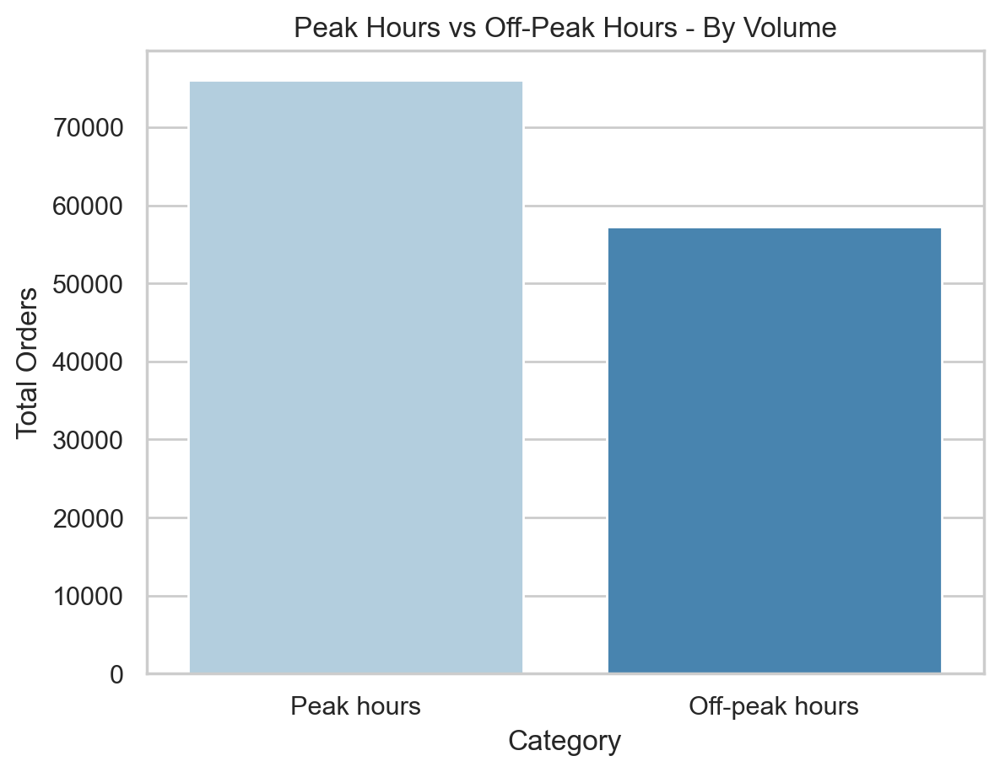

In [58]:
# Plotting the volume for Peak and Off peak hours
data1 = {"Category": ["Peak hours", "Off-peak hours"], "Total Orders": [peak_hours.sum(), off_peak_hours.sum()]}
df_sum = pd.DataFrame(data1)

sns.set_style("whitegrid")
sns.barplot(x="Category" , y="Total Orders", data=df_sum, palette="Blues")
plt.title("Peak Hours vs Off-Peak Hours - By Volume")
plt.show()

##### Some of the Numeric Variable's Histograms

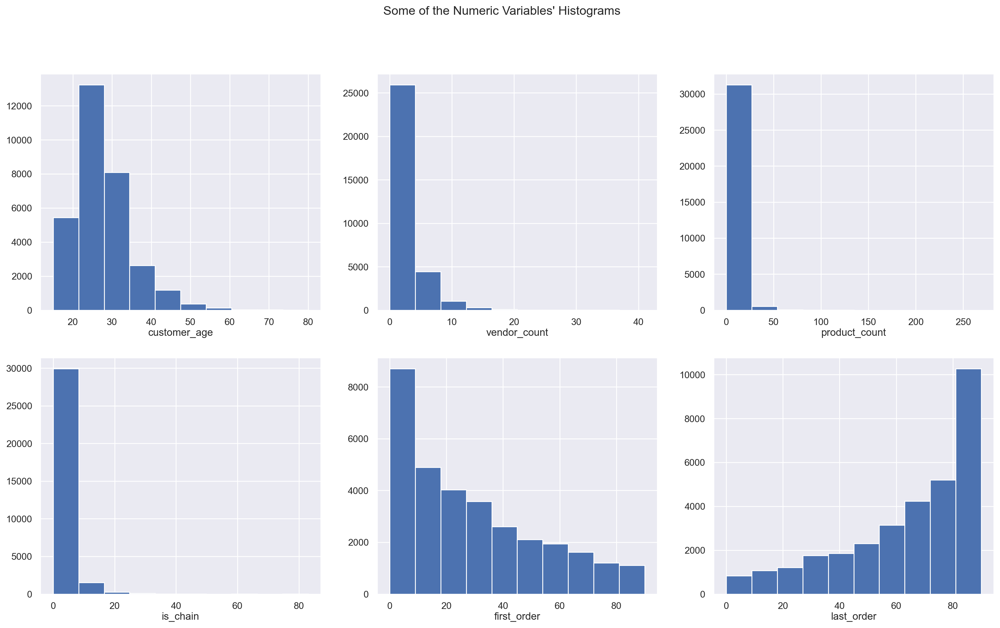

In [59]:
# Some Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features[0:5]) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric_features[0:5]): # Notice the zip() function and flatten() method
    ax.hist(df[feat])
    ax.set_title(feat, y=-0.13)
    
# Layout
# Add a centered title to the figure:
title = "Some of the Numeric Variables' Histograms"

plt.suptitle(title)

plt.show()

##### Cuisines Histograms

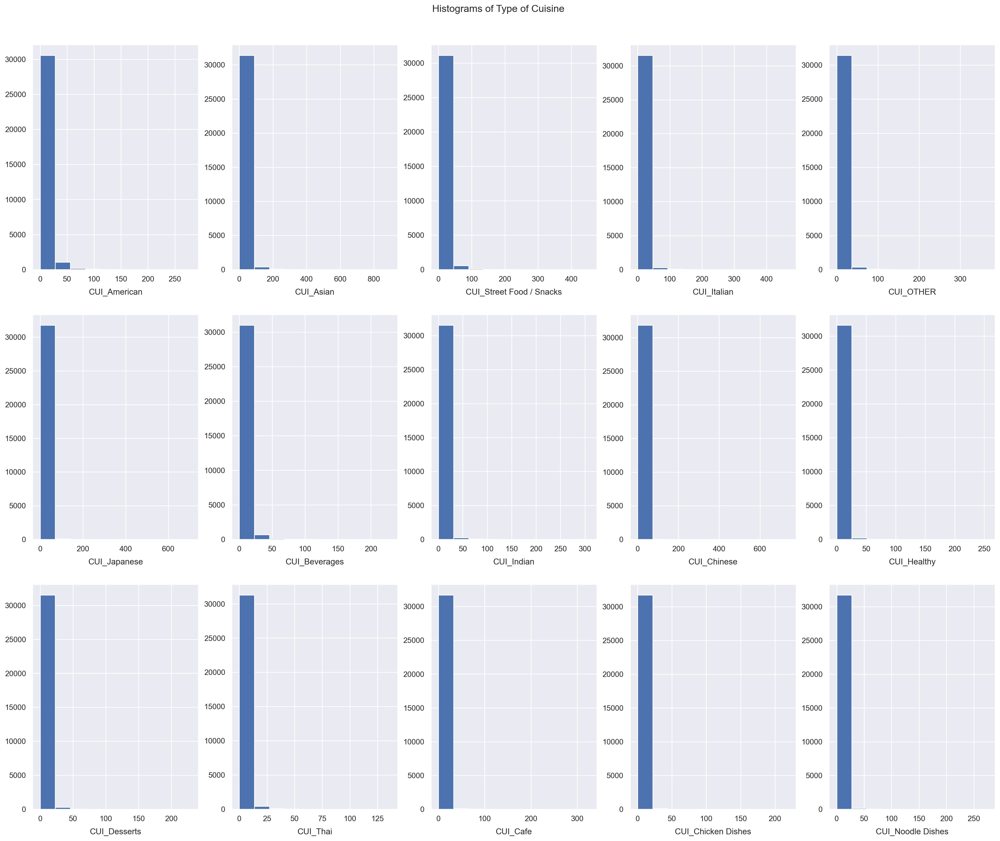

In [60]:
sns.set()

fig, axes = plt.subplots(3, ceil(len(CUI) / 3), figsize=(25, 20))

for ax, feat in zip(axes.flatten(), CUI):
    ax.hist(df1[feat])
    ax.set_title(feat, y=-0.13)

title = "Histograms of Type of Cuisine"
plt.suptitle(title, y=0.92)

plt.show()



##### Days Histograms

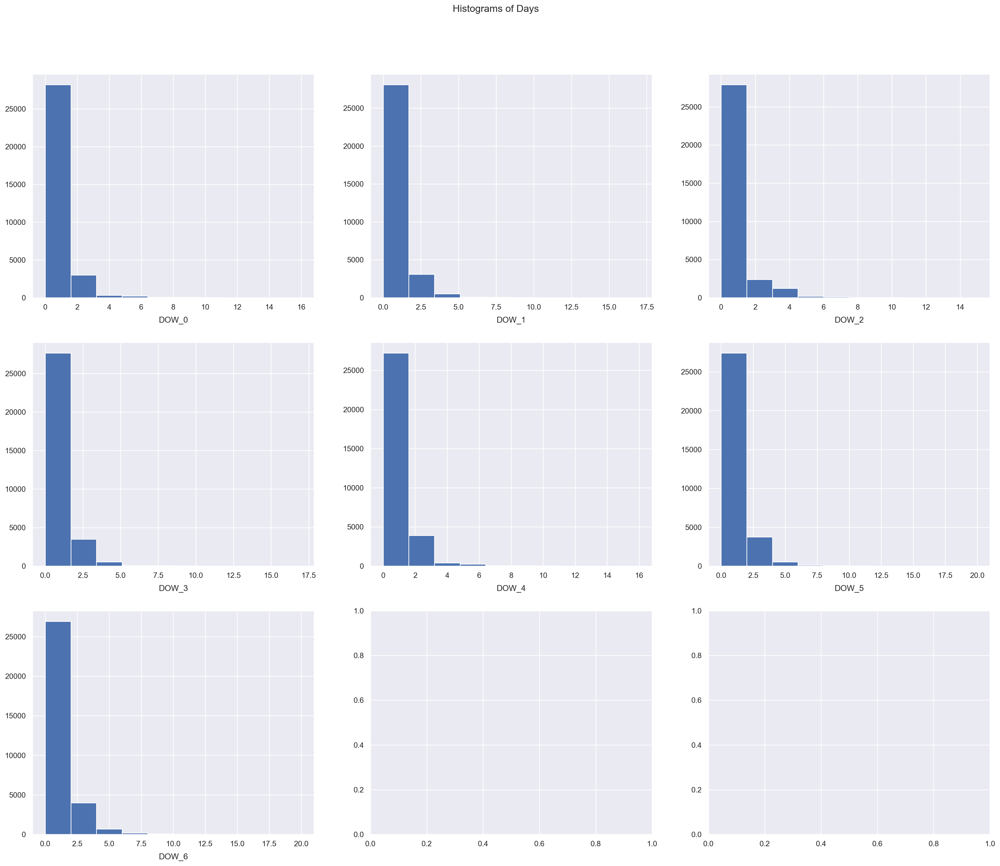

In [61]:
Days = ['DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6']

sns.set()

fig, axes = plt.subplots(3, ceil(len(Days) / 3), figsize=(25, 20))

for ax, feat in zip(axes.flatten(), Days):
    ax.hist(df1[feat])
    ax.set_title(feat, y=-0.13)

plt.suptitle("Histograms of Days", y=0.95)

plt.show()


##### Hours Histograms

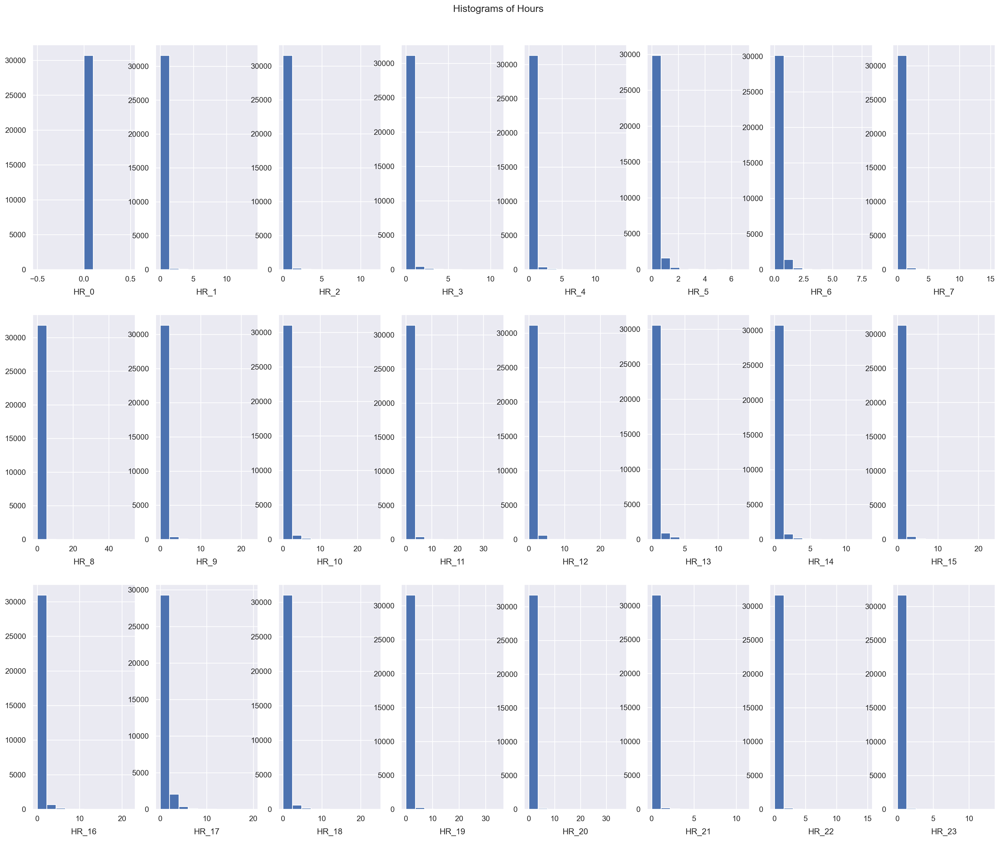

In [62]:
Hours = ['HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23']

sns.set()

fig, axes = plt.subplots(3, ceil(len(Hours) / 3), figsize=(25, 20))

for ax, feat in zip(axes.flatten(), Hours):
    ax.hist(df1[feat])
    ax.set_title(feat, y=-0.13)

title = "Histograms of Hours"
plt.suptitle(title, y=0.92)

plt.show()


##### New Metric features Histograms

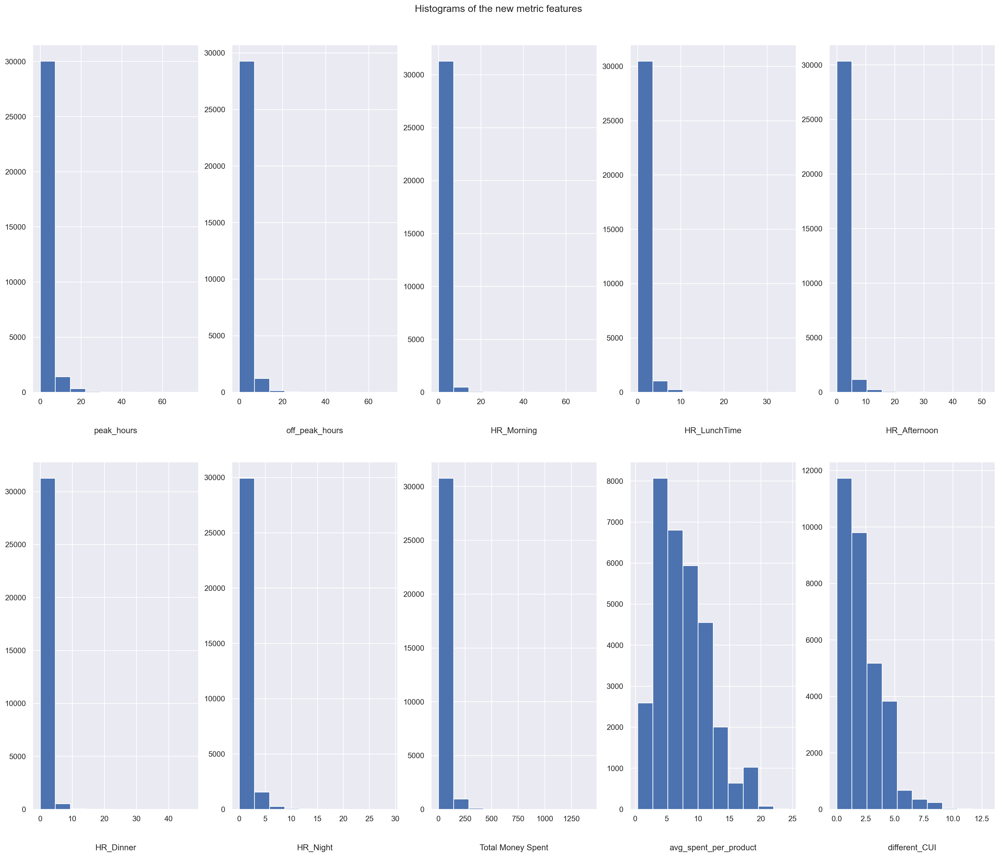

In [63]:
new_features = ['peak_hours','off_peak_hours','HR_Morning','HR_LunchTime','HR_Afternoon','HR_Dinner','HR_Night','Total Money Spent','avg_spent_per_product','different_CUI']

sns.set()

fig, axes = plt.subplots(2, ceil(len(new_features) / 2), figsize=(25, 20))

for ax, feat in zip(axes.flatten(), new_features):
    ax.hist(df1[feat])
    ax.set_title(feat, y=-0.13)

title = "Histograms of the new metric features"
plt.suptitle(title, y=0.92)

plt.show()

##### Some of the Numeric Variable's Box Plots

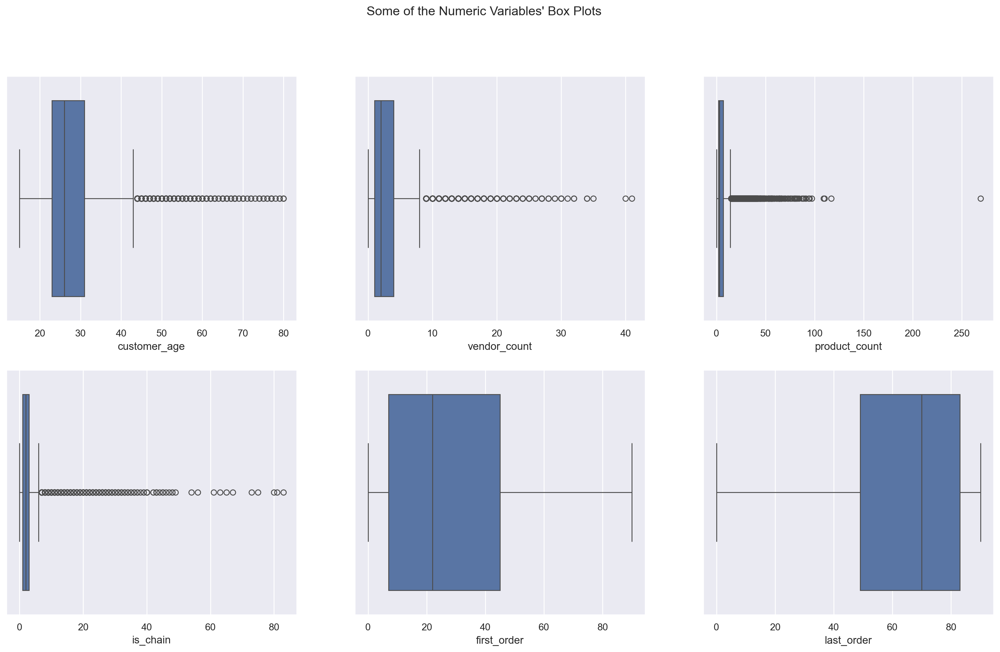

In [64]:
# Some Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features[0:5]) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features[0:5]): # Notice the zip() function and flatten() method
    sns.boxplot(x=df1[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Some of the Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

##### Cuisines Box Plots

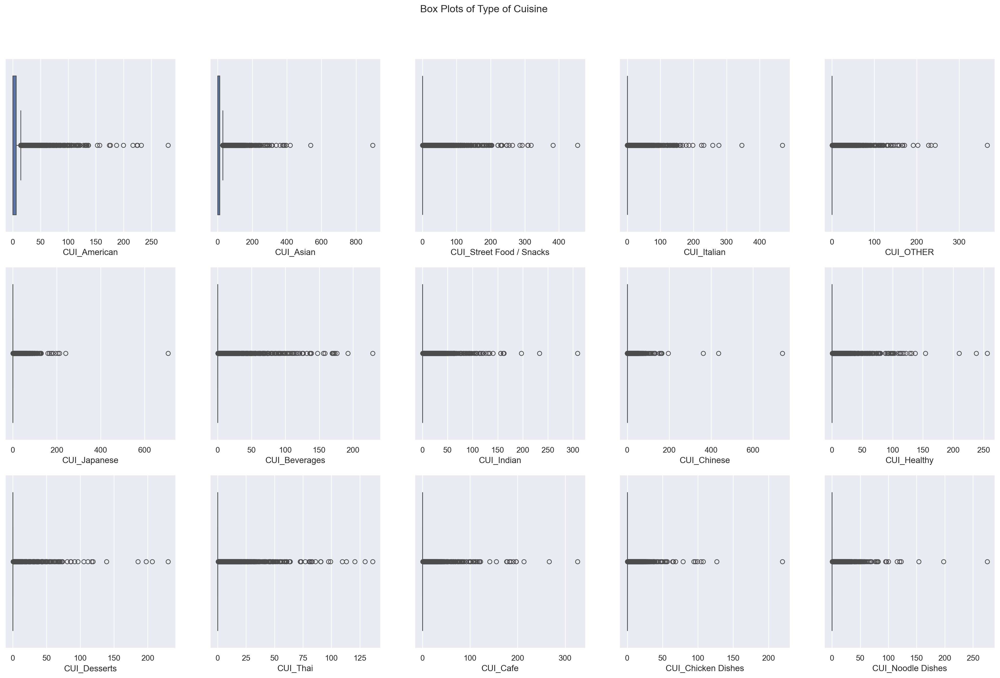

In [65]:
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, ceil(len(CUI) / 3), figsize=(25, 15))

# Plot data
for ax, feat in zip(axes.flatten(), CUI):
    sns.boxplot(x=df1[feat], ax=ax)

# Layout
title = "Box Plots of Type of Cuisine"
plt.suptitle(title, y=0.95)

plt.show()


##### Days Box Plots

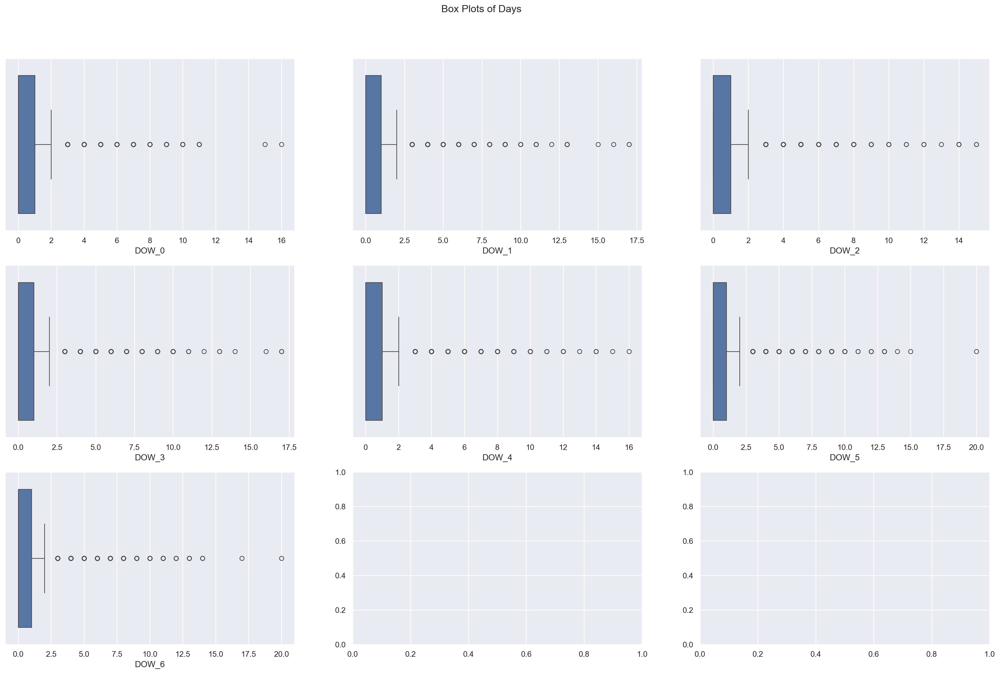

In [66]:
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, ceil(len(Days) / 3), figsize=(25, 15))

# Plot data
for ax, feat in zip(axes.flatten(), Days):
    sns.boxplot(x=df1[feat], ax=ax)

# Layout
title = "Box Plots of Days"
plt.suptitle(title, y=0.95)

plt.show()


##### Hours Box Plots

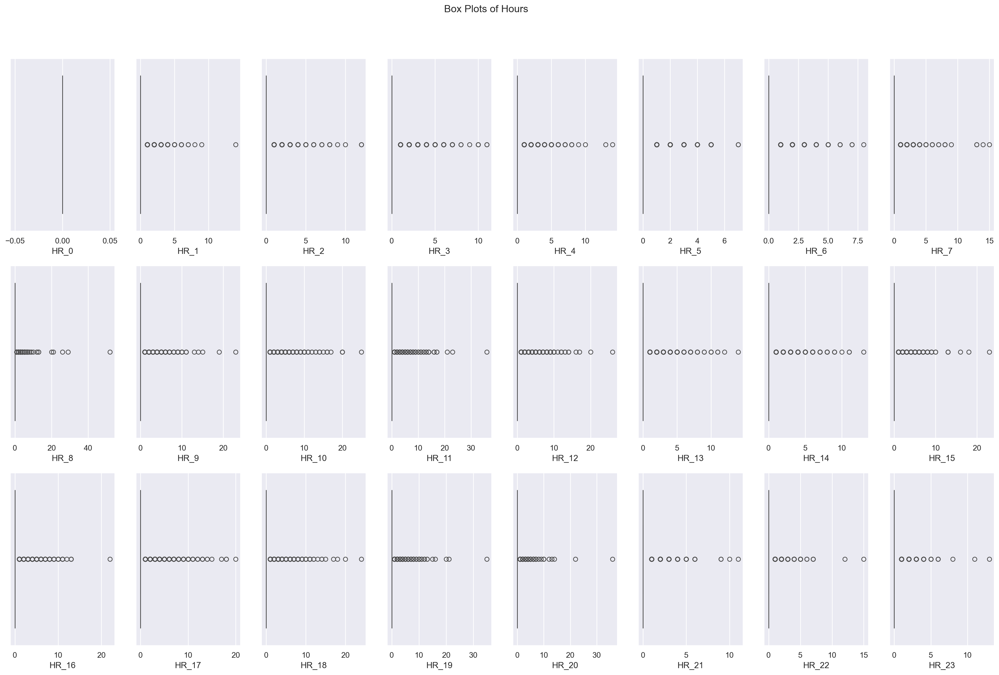

In [67]:
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, ceil(len(Hours) / 3), figsize=(25, 15))

# Plot data
for ax, feat in zip(axes.flatten(), Hours):
    sns.boxplot(x=df1[feat], ax=ax)

# Layout
title = "Box Plots of Hours"
plt.suptitle(title, y=0.95)

plt.show()


##### New Metric Features Box Plots

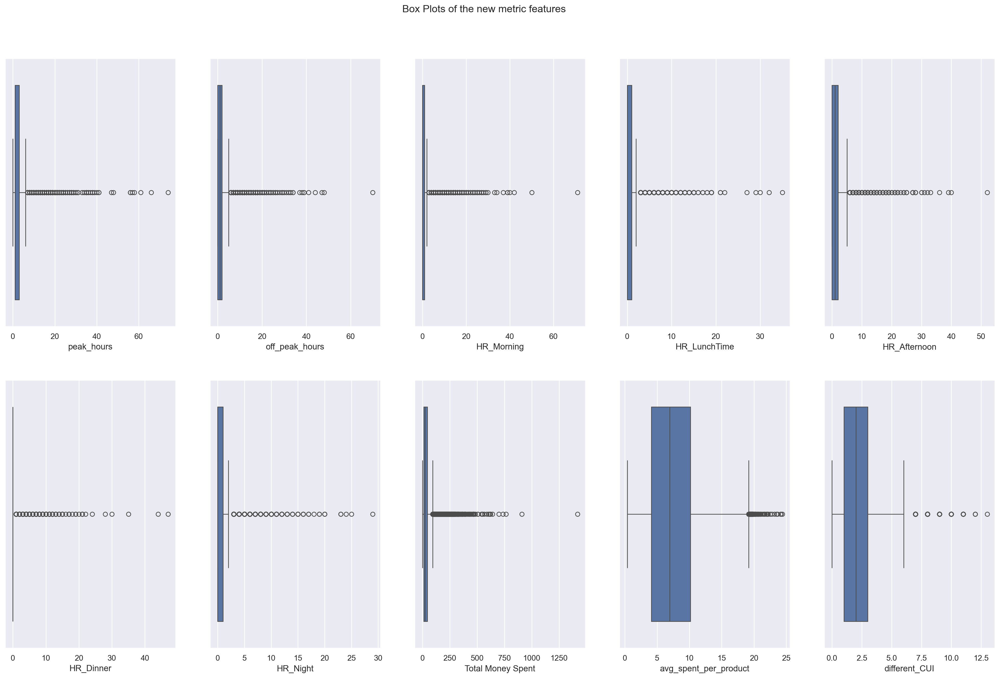

In [68]:
new_features = ['peak_hours','off_peak_hours','HR_Morning','HR_LunchTime','HR_Afternoon','HR_Dinner','HR_Night','Total Money Spent','avg_spent_per_product','different_CUI']

sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(new_features) / 2), figsize=(25, 15))

# Plot data
for ax, feat in zip(axes.flatten(), new_features):
    sns.boxplot(x=df1[feat], ax=ax)

# Layout
title = "Box Plots of the new metric features"
plt.suptitle(title, y=0.95)

plt.show()

<a class="anchor" id="in-depth-categorical-analysis">

### 2.2.2. In-Depth Categorical Analysis

#### Customer Region

##### Assumption 1:

The first assumptiom is a purely logical one, where we associate cities, with the start of the region numbers.

In [69]:
unique_customer_regions = df1["customer_region"].unique()

unique_customer_regions.sort()

print(unique_customer_regions)
# So here lies all of our regions.

['-' '2360' '2440' '2490' '4140' '4660' '8370' '8550' '8670']


In [70]:
len(df1["customer_region"].unique())
# 9 unique regions, which for 3 cities would be 3 regions for each city.

9

In [71]:
print(df1["customer_region"].value_counts(ascending=True))
print("\n")
print(df1["customer_region"].value_counts(ascending=True,normalize=True))

customer_region
8550      13
-        442
2490     445
8370     495
4140     857
2440    1483
2360    8829
4660    9550
8670    9761
Name: count, dtype: int64


customer_region
8550    0.000408
-       0.013867
2490    0.013961
8370    0.015529
4140    0.026886
2440    0.046525
2360    0.276988
4660    0.299608
8670    0.306227
Name: proportion, dtype: float64


We can observe that the region where there are more customers is in region 8670.  
~31% of the customers are in region 8670. <br>
~30% of the customers are in region 4660. <br>
~27.7% of the customers are in region 2360. 

As per the guidelines, we know that we have information based on 3 cities. We can also verify that using our unique method, we have some values that are missing ("-"). 
One assumption that could be done is that we have 9 regions, 3 per city. We can segment cities by their initial number: 
- For example: regions that start with number 2, represent city "2", the same for number 4 and number 8.
- Following this rationale, we can assume that one possibility is to that the missing values represent the missing region from the "4" city. In this case, we would have 3 regions per city.
- We can assume the region named "-" belongs to the the same city as region 4140 and 4660.

We should also note that after replacing this missing value, with a unique identifier for the "4" city region, we are able to set customer_region as an integer data type.

##### Assumption 2: 

After analysing some of the data, we can see that the region "-" seems to follow the patterns of the city "8". Let's see this in more detail below

Average spent on a product by customer_region
customer_region
-       11.530420
2360     3.764555
2440     3.673005
2490     3.722049
4140     7.745403
4660     7.841047
8370    11.895284
8550    11.707618
8670    11.157016
Name: avg_spent_per_product, dtype: float64


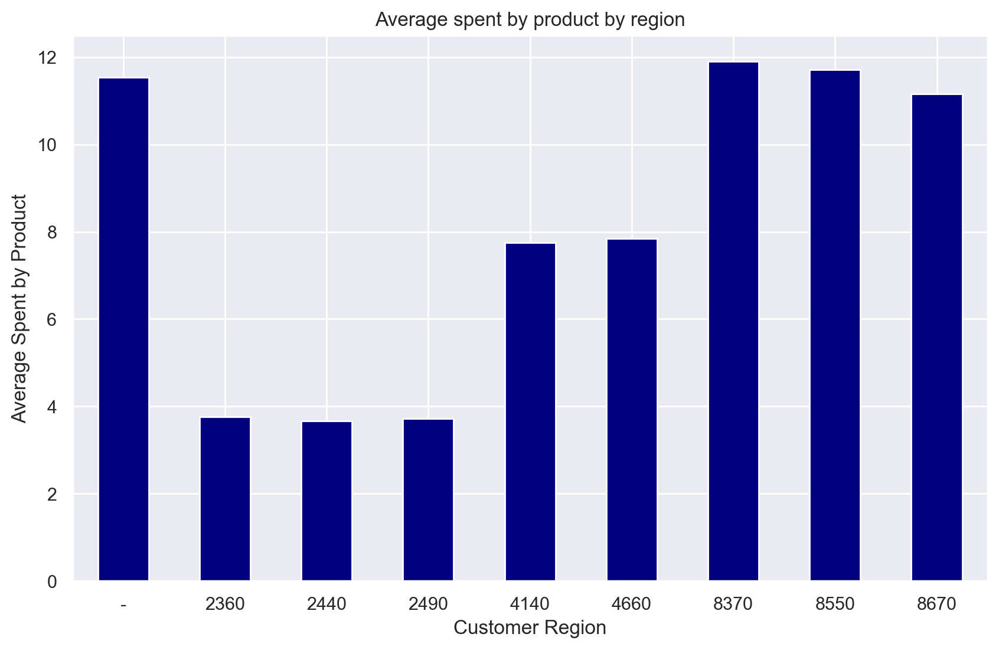

In [72]:
avg_spent_per_region = df1.groupby('customer_region')['avg_spent_per_product'].mean()

print('Average spent on a product by customer_region')
print(avg_spent_per_region)

plt.figure(figsize=(10, 6))
avg_spent_per_region.plot(kind='bar', color='Navy')
# Labels and Title
plt.xlabel('Customer Region')
plt.ylabel('Average Spent by Product')
plt.title('Average spent by product by region')
plt.xticks(rotation=0)
plt.show()

Here we can see that each "city" seems to follow a pattern. All cities have similar average spending by product and the missing region seems to be closer to the city "8" pattern

We will now select the 7 cuisines where most money is spent and analyse the proportion of money spent on each region

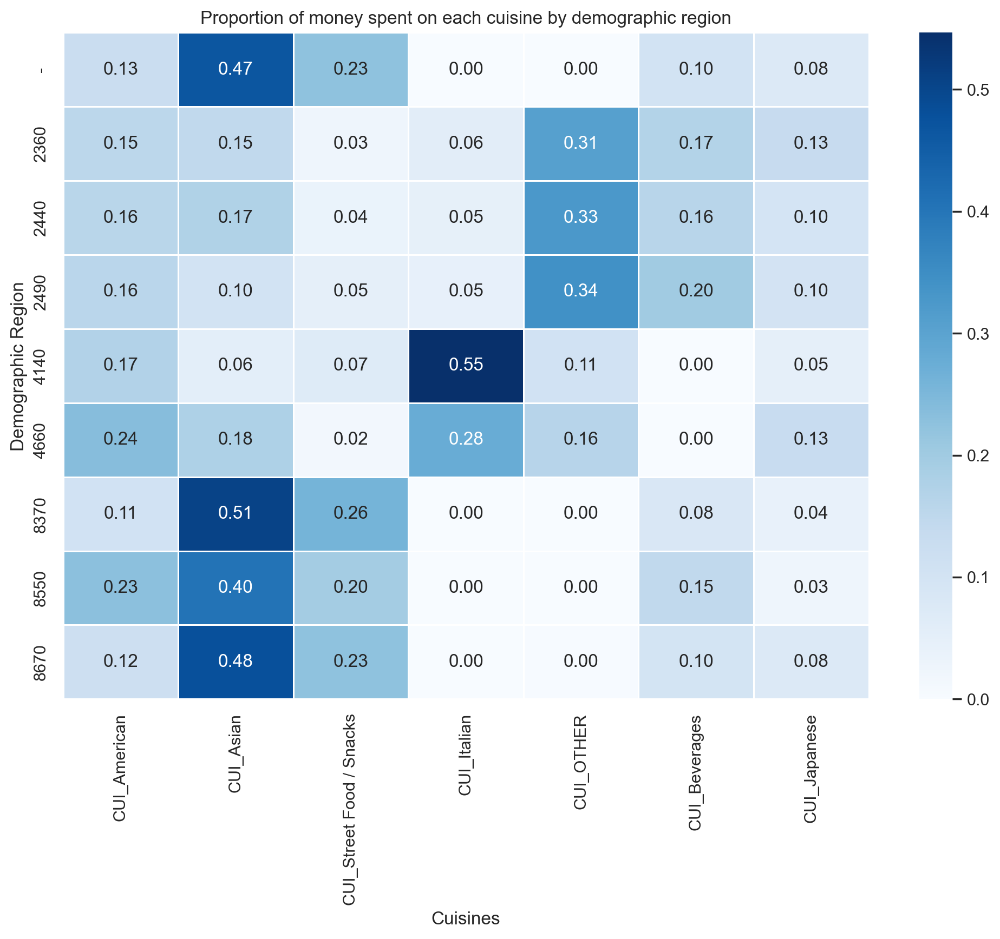

In [73]:
# 7 cuisines where most money was spent 
top7_CUI = ['CUI_American', 'CUI_Asian', 'CUI_Street Food / Snacks', 'CUI_Italian', 'CUI_OTHER', 'CUI_Beverages', 'CUI_Japanese']

#Grouped the data by region and sum the values for each type of cuisine
df_grouped = df1.groupby('customer_region')[top7_CUI].sum()


df_proporcoes = df_grouped.div(df_grouped.sum(axis=1), axis=0)


plt.figure(figsize=(12, 8))
sns.heatmap(df_proporcoes, annot=True, fmt=".2f", cmap='Blues', linewidths=.5)

# Labels and Title
plt.title("Proportion of money spent on each cuisine by demographic region")
plt.xlabel("Cuisines")
plt.ylabel("Demographic Region")
# plt.savefig('Proportion of money spent on each cuisine by demographic region.png', format='png', dpi=300, bbox_inches='tight')
plt.show()


We can again see a clear pattern in each of the cities and the missing region seems to be much closer to the city "8" pattern

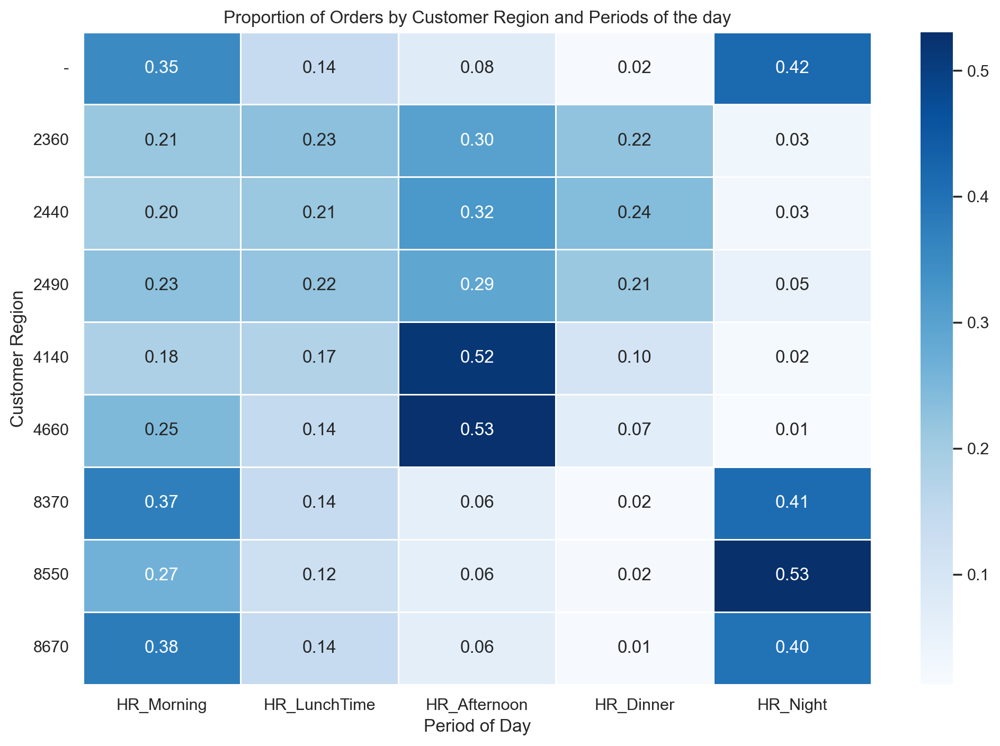

In [74]:
time_periods = ['HR_Morning', 'HR_LunchTime', 'HR_Afternoon', 'HR_Dinner', 'HR_Night']
age_time_orders = df1.groupby('customer_region')[time_periods].mean()

age_time_orders_proportion = age_time_orders.div(age_time_orders.sum(axis=1), axis=0)

plt.figure(figsize=(12, 8))
sns.heatmap(age_time_orders_proportion, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5)

plt.title('Proportion of Orders by Customer Region and Periods of the day')
# Labels
plt.xlabel('Period of Day')
plt.ylabel('Customer Region')
plt.xticks(rotation=0)
plt.yticks(rotation=0)

plt.show()

Analysing the proportion of orders by customer region and periods of the day, we also see that pattern

This is important to notice, and this is why we had two assumptions that could possibly be made about the missing value for the customer region... One is supported by "logic", and what would make sense, and the other mostly supported by patterns and aggregation. We will eventually test these hyptohesis during the preprocessing part, to see what works best!

#### Last Promo Used

In [75]:
# Now for the last_promo variable:
print(df1.last_promo.unique())
print(df1["last_promo"].value_counts(normalize=True))

['DELIVERY' 'DISCOUNT' '-' 'FREEBIE']
last_promo
-           0.525302
DELIVERY    0.197082
DISCOUNT    0.141051
FREEBIE     0.136565
Name: proportion, dtype: float64


Once more, there's an assumption we can make on the "missing" data. 
- Since this variable accounts for type of promotion the user used in their last order, we can assume that the "-" value accounts for "No Promo Used", this could represent some clarity down the line, specially for graphical representation.
- "-" Represents a large proportion of the data. In a business, it should be more frequent that most orders are made without any type of discount than the contrary.

#### Payment Method

In [76]:
df1["payment_method"].value_counts()

payment_method
CARD    20153
DIGI     6098
CASH     5624
Name: count, dtype: int64

In [77]:
df1["payment_method"].isna().sum()

0

#### Age Groups

In [78]:
df1["age_group"].unique()

['15-25', '36-45', NaN, '26-35', '46-55', '56-65', '66-75', '76-85']
Categories (7, object): ['15-25' < '26-35' < '36-45' < '46-55' < '56-65' < '66-75' < '76-85']

In [79]:
df1["age_group"].value_counts()

age_group
15-25    14665
26-35    12686
36-45     2974
46-55      644
56-65      113
66-75       32
76-85       14
Name: count, dtype: int64

A lot of our customer is mainly younger, which is typical in a society ever so more propelled by technology... For clustering purposes, this might prove useful, since this categorizes different behaviours.
- Note: We can see that for the older population (45+), the count of these groups seem to decrease imensely. It might be more interesting to further aggregate younger groups into smaller bins and have a wider aggregation for older population. Therefore, we would be able to separate perhaps different behaviors in the younger generation versus the older generation.

#### Promo Usage

In [80]:
df1['promo_used'].unique() 

array([1, 0], dtype=int64)

In [81]:
df1['promo_used'].value_counts()

promo_used
0    16744
1    15131
Name: count, dtype: int64

<a class="anchor" id="2221-visualization">

#### 2.2.2.1. Visualization       

##### Some Categorical Variable's Bar Plots

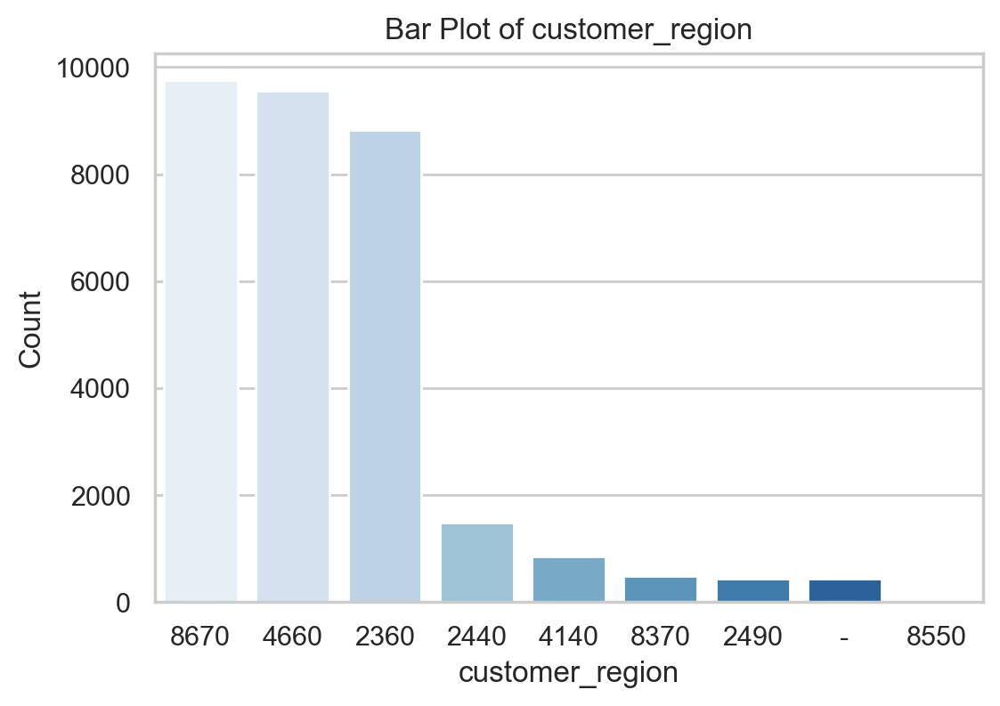

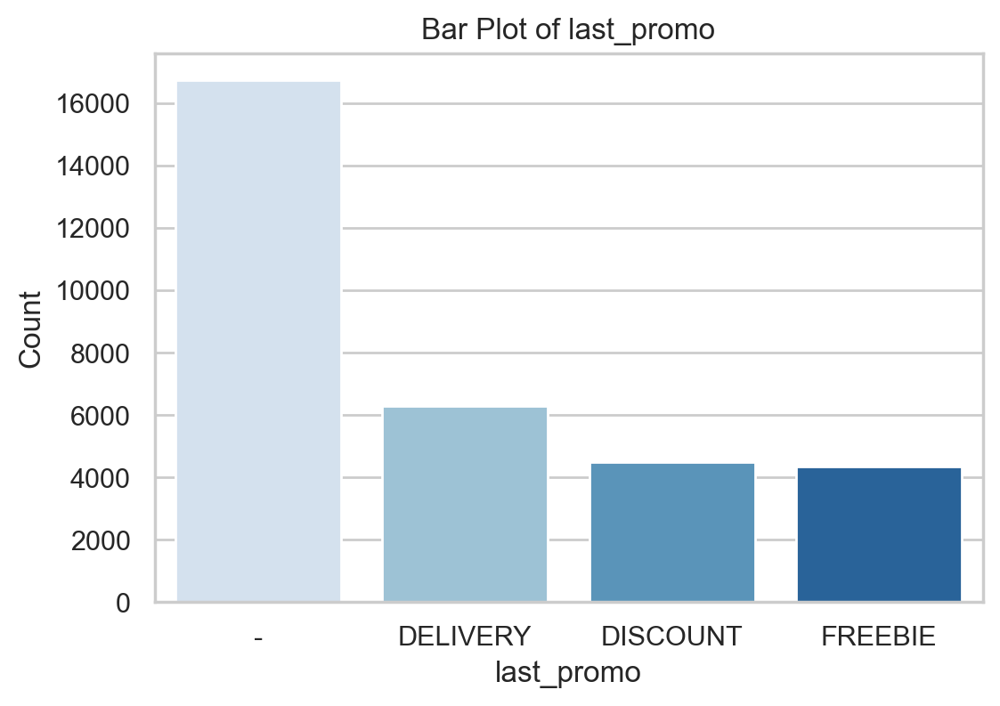

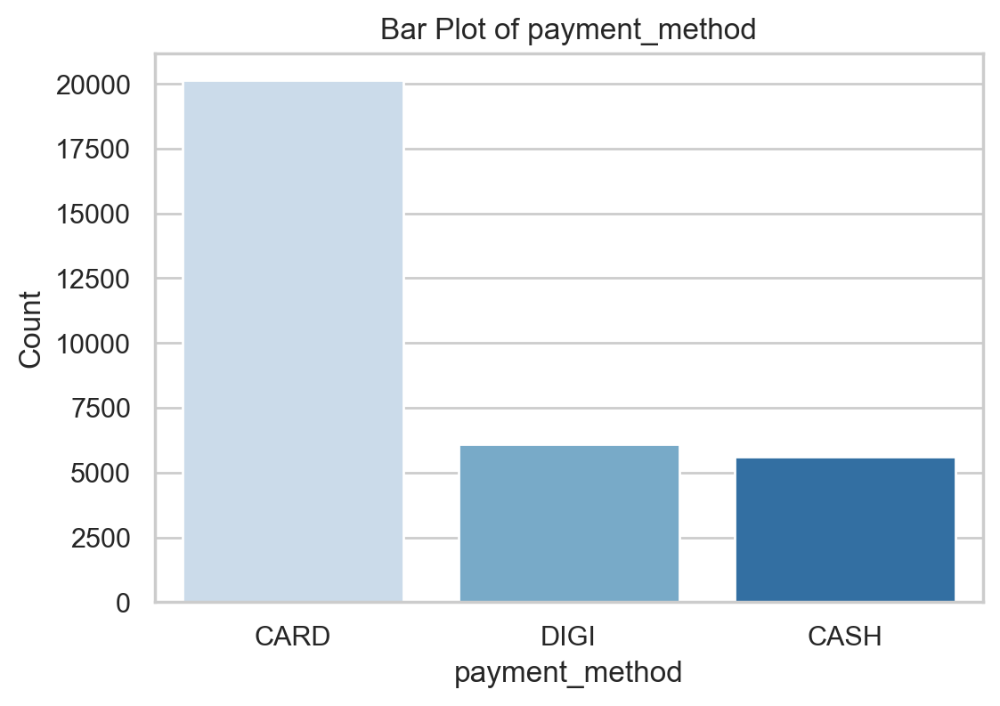

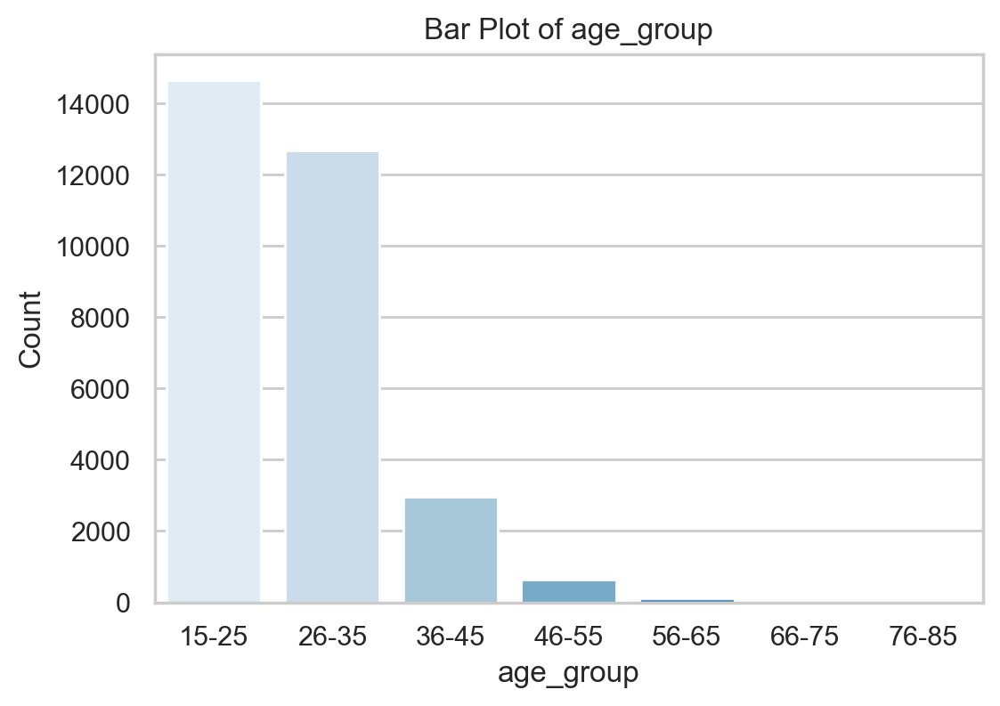

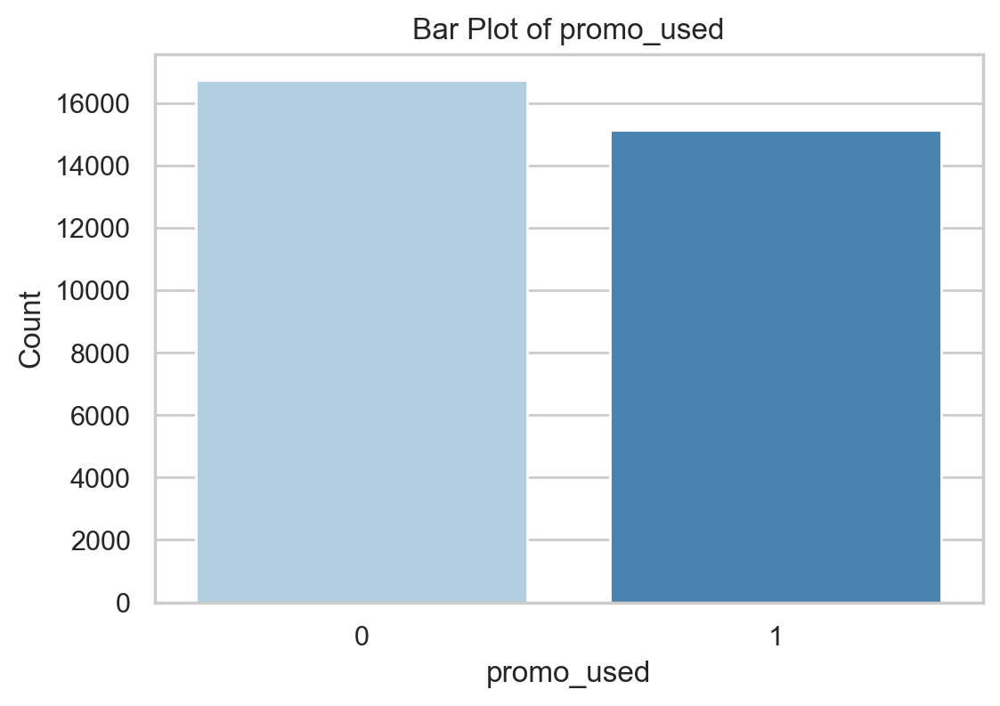

In [82]:
# Set the style for the plots
sns.set(style="whitegrid")
    
for feature in non_metric_features:
    if feature != 'customer_id':
         plt.figure(figsize=(6,4))  #we change the size of these figures so we can visualize the labels
         sns.countplot(data=df1, x=feature, order=df1[feature].value_counts().index, palette='Blues')
         plt.title(f'Bar Plot of {feature}')
         plt.xlabel(feature)
         plt.ylabel('Count')
    
    plt.show()

<a class="anchor" id = "bivariate-eda-description">

## 2.3. Bivariate EDA: Description

<a class="anchor" id = "numeric-numeric-correlations">

### 2.3.1. Numeric-Numeric: Correlations

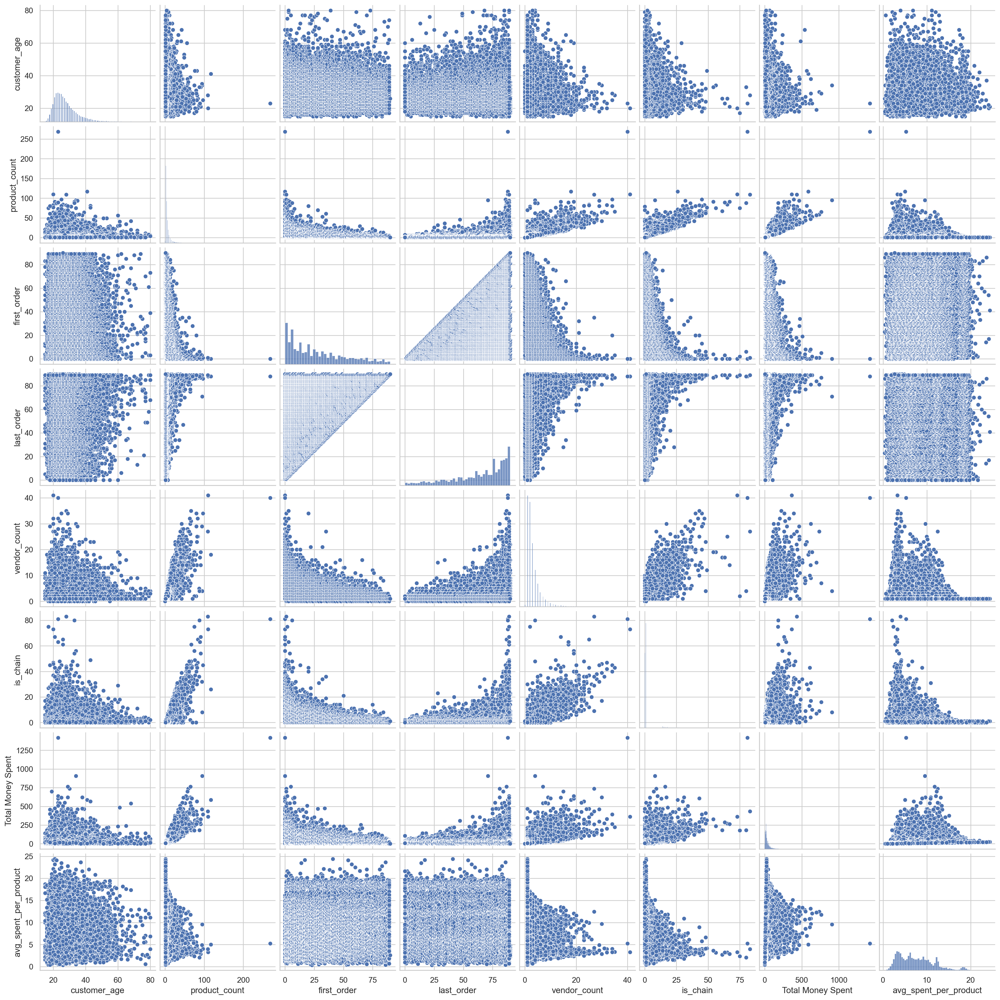

In [83]:
colunas_para_pairplot = ['customer_age', 'product_count', 'first_order', 'last_order','vendor_count', 'is_chain', 'Total Money Spent', 'avg_spent_per_product']

# Create the Pair Plot with these columns.
sns.pairplot(df1[colunas_para_pairplot])

# Show the graph.
plt.show()

Since we dont have a lot of linear relationships we are going to use the Spearman Correlation, because it's less sensitive to outliers compared to Pearson's correlation.

In [84]:
# correlation matrix using Spearman correlation
corr = df1[metric_features.columns].corr(method="spearman")

mask = np.triu(np.ones_like(corr, dtype=bool))
sns.set_style("white")

plt.figure(figsize=(50, 50))
sns.heatmap(corr, mask=mask, annot=True, cmap='Blues', fmt=".2f", linewidths=0.2)
plt.title('Spearman Correlation Matrix for Numeric Variables')
plt.show()

##### Cuisines by Time of the Day

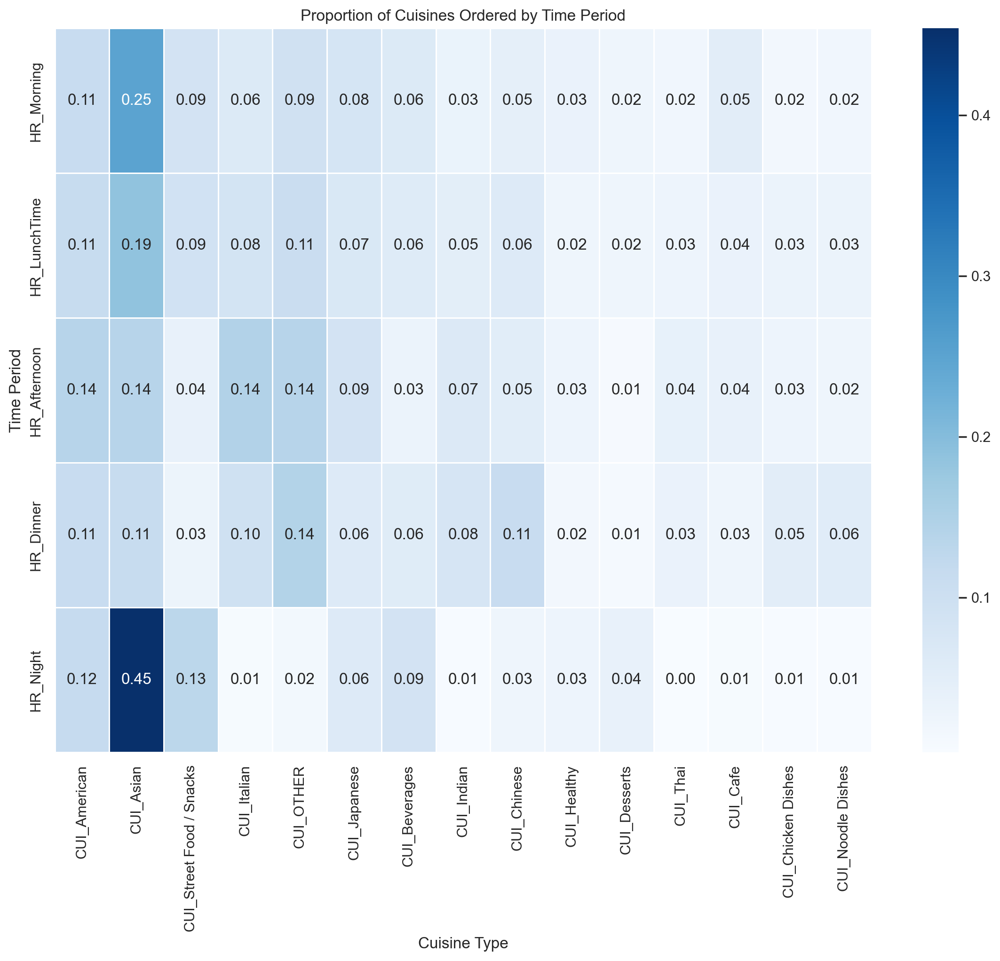

In [85]:
HR_columns = ['HR_Morning', 'HR_LunchTime', 'HR_Afternoon', 'HR_Dinner', 'HR_Night']

# Multiply HR columns by CUI columns to get the counts of each cuisine per time period
df_cui_hr = df1[HR_columns].T.dot(df1[CUI])

# Calculate the proportion of each cuisine within each time period
cui_hr_proportion = df_cui_hr.div(df_cui_hr.sum(axis=1), axis=0)

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(cui_hr_proportion, annot=True, fmt=".2f", cmap="Blues", linewidths=0.5)
plt.title("Proportion of Cuisines Ordered by Time Period")
plt.xlabel("Cuisine Type")
plt.ylabel("Time Period")
plt.show()


<a class="anchor" id = "numeric-categorical-correlations">

### 2.3.2. Numeric-Categorical: Correlations

#### Customer Region by Total Money Spent

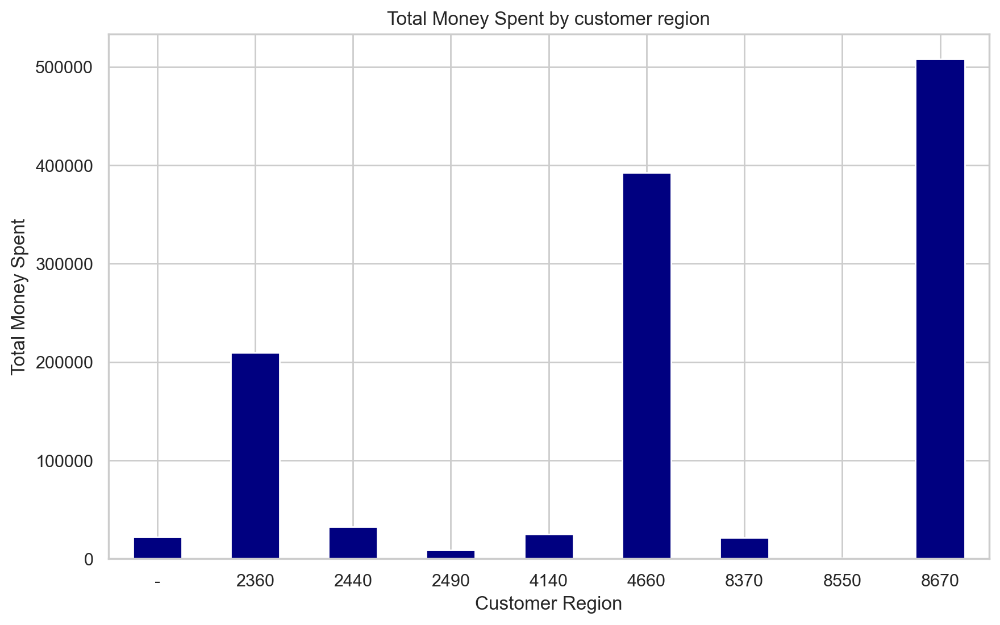

In [86]:
# Create a grouped DataFrame with the average 'Product Count' by region
df_grouped = df1.groupby('customer_region')['Total Money Spent'].sum()

sns.set_style("whitegrid")
# Create the bar chart
plt.figure(figsize=(10, 6))
df_grouped.plot(kind='bar', color='navy')

# Add title and labels.
plt.title('Total Money Spent by customer region')
plt.xlabel('Customer Region')
plt.ylabel('Total Money Spent')
plt.xticks(rotation=0)

# Show the graph
plt.show()


#### Customer Region by Average Total Money Spent

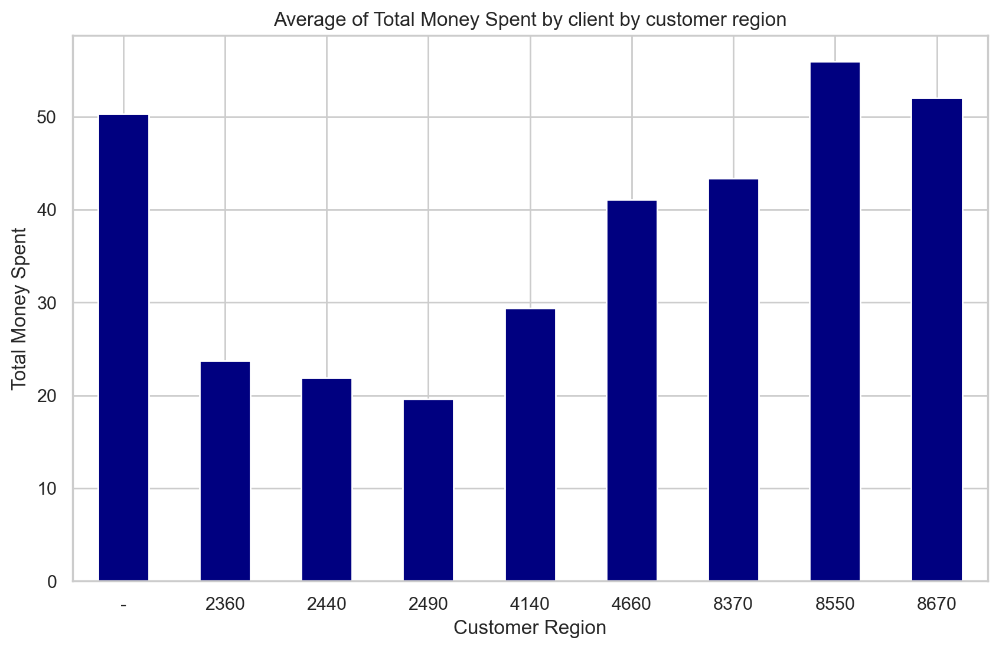

In [87]:

# Create a grouped DataFrame with the average 'Product Count' by region
df_grouped = df1.groupby('customer_region')['Total Money Spent'].mean()


sns.set_style("whitegrid")
# Create the bar chart
plt.figure(figsize=(10, 6))
df_grouped.plot(kind='bar', color='navy')

# Add title and labels
plt.title('Average of Total Money Spent by client by customer region')
plt.xlabel('Customer Region')
plt.ylabel('Total Money Spent')
plt.xticks(rotation=0)


# Show the graph
plt.show()


#### Customer Region by Product Count

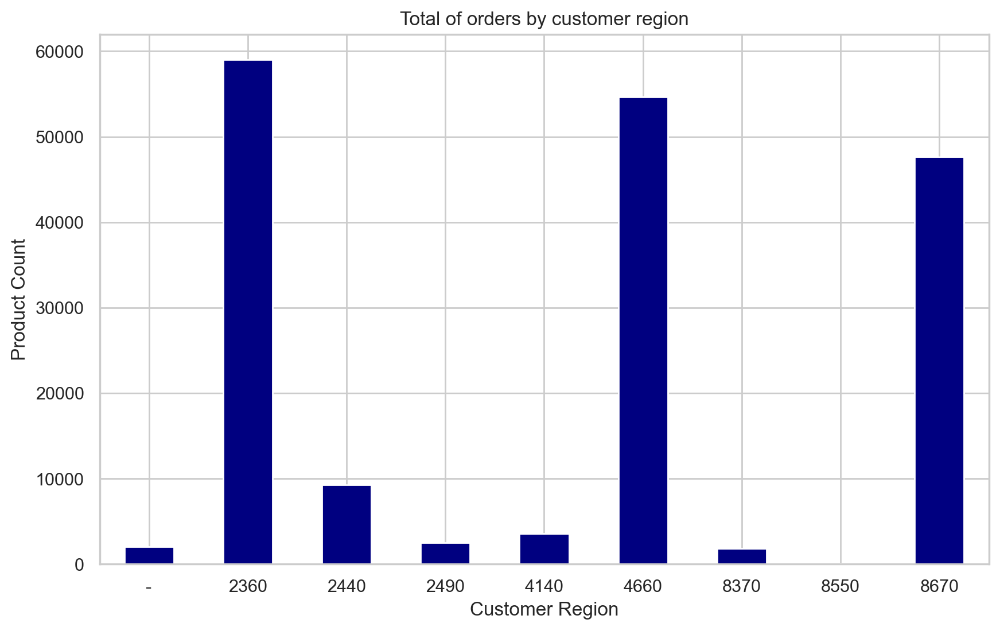

In [88]:
# Create a grouped DataFrame with the average 'Product Count' by region
df_grouped = df1.groupby('customer_region')['product_count'].sum()


sns.set_style("whitegrid")
# Create the bar chart
plt.figure(figsize=(10, 6))
df_grouped.plot(kind='bar', color='navy')

# Add title and labels
plt.title('Total of orders by customer region')
plt.xlabel('Customer Region')
plt.ylabel('Product Count')
plt.xticks(rotation=0)


# Show the graph
plt.show()


#### Customer Region by Average Product Count

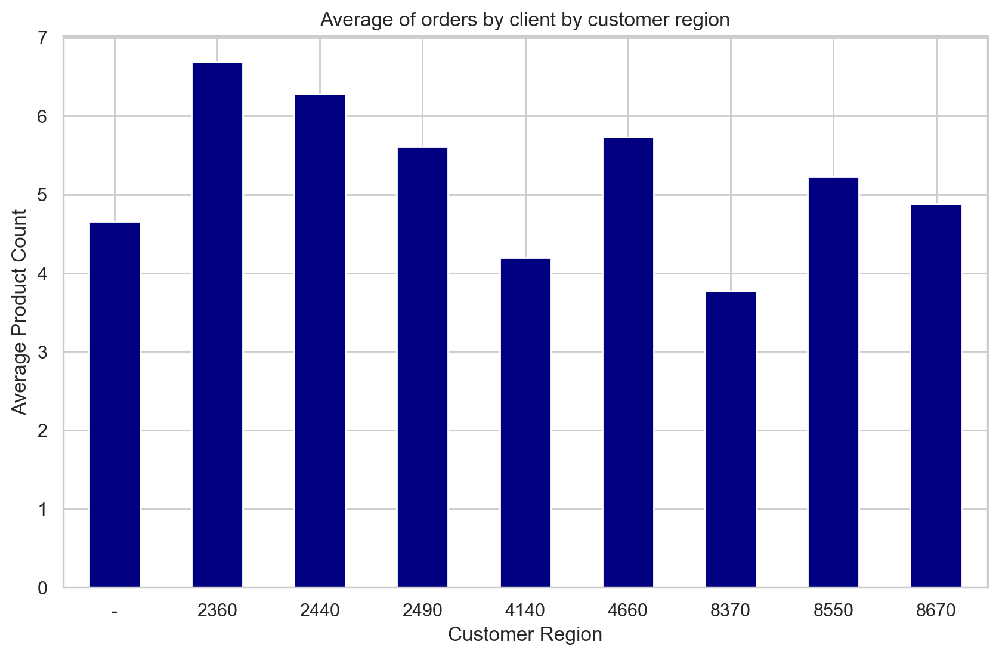

In [89]:

# Create a grouped DataFrame with the average 'Product Count' by region
df_grouped = df1.groupby('customer_region')['product_count'].mean()


sns.set_style("whitegrid")
# Create the bar chart
plt.figure(figsize=(10, 6))
df_grouped.plot(kind='bar', color='navy')

# Add title and labels
plt.title('Average of orders by client by customer region')
plt.xlabel('Customer Region')
plt.ylabel('Average Product Count')
plt.xticks(rotation=0)


# Show the graph
plt.show()


#### Cuisines by Total Money Spent

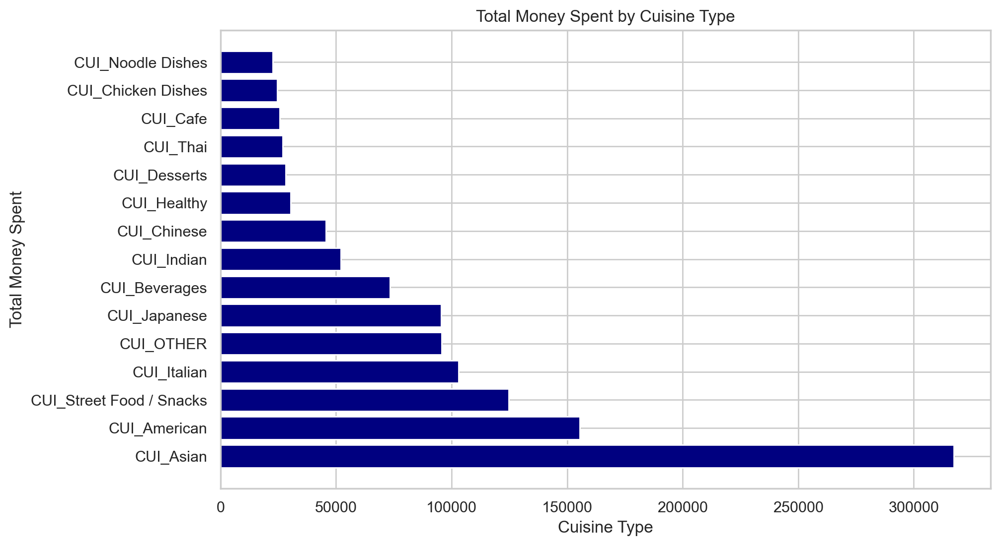

In [90]:
# Calculate the total of total_money_spent for each cuisine category
total_money_spent = df1[CUI].sum()

# Sort the values
total_money_spent_sorted = total_money_spent.sort_values(ascending=False)


sns.set_style("whitegrid")
# Create the bar chart with the values and categories sorted
plt.figure(figsize=(10, 6))
plt.barh(total_money_spent_sorted.index, total_money_spent_sorted, color='navy')

# Add title and labels
plt.title('Total Money Spent by Cuisine Type')
plt.xlabel('Cuisine Type')
plt.ylabel('Total Money Spent')
plt.xticks(rotation=0)

# Show the graph
plt.show()


#### Different Cuisines and Vendor Count

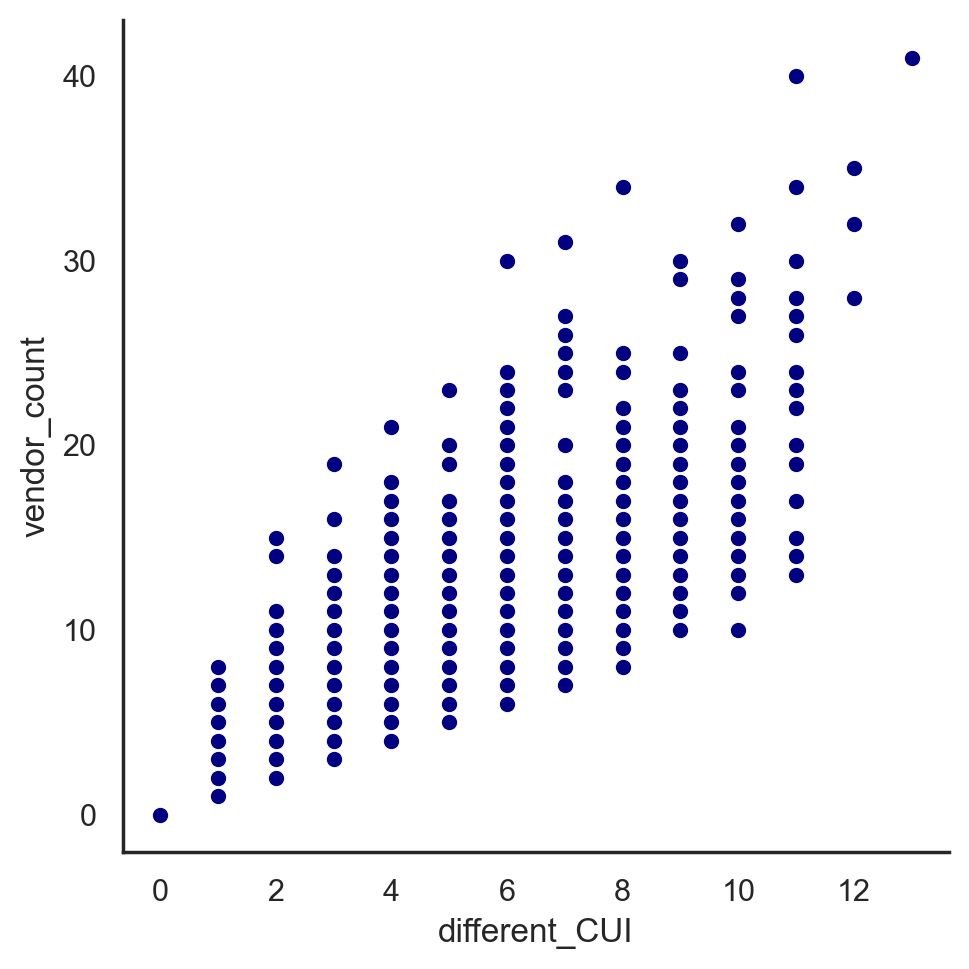

In [92]:
sns.relplot(x='different_CUI', y='vendor_count', data=df1, kind='scatter', color="navy")

#### Type of Promotion Used by Average Money Spent

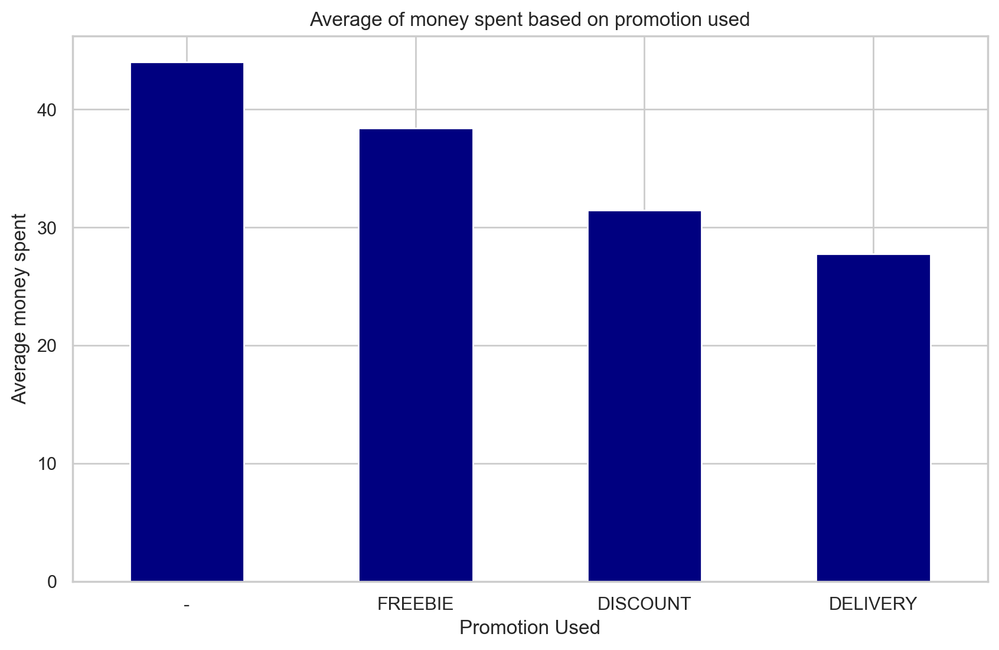

In [ ]:
df_grouped = df1.groupby('last_promo')['Total Money Spent'].mean().sort_values(ascending=False)


sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))
df_grouped.plot(kind='bar', color='navy')
# Labels
plt.title('Average of money spent based on promotion used')
plt.xlabel('Promotion Used')
plt.ylabel('Average money spent')
plt.xticks(rotation=0)  # Rotate x-axis labels horizontally
plt.show()

#### Type of Promotion used by Average Spent per Product Count

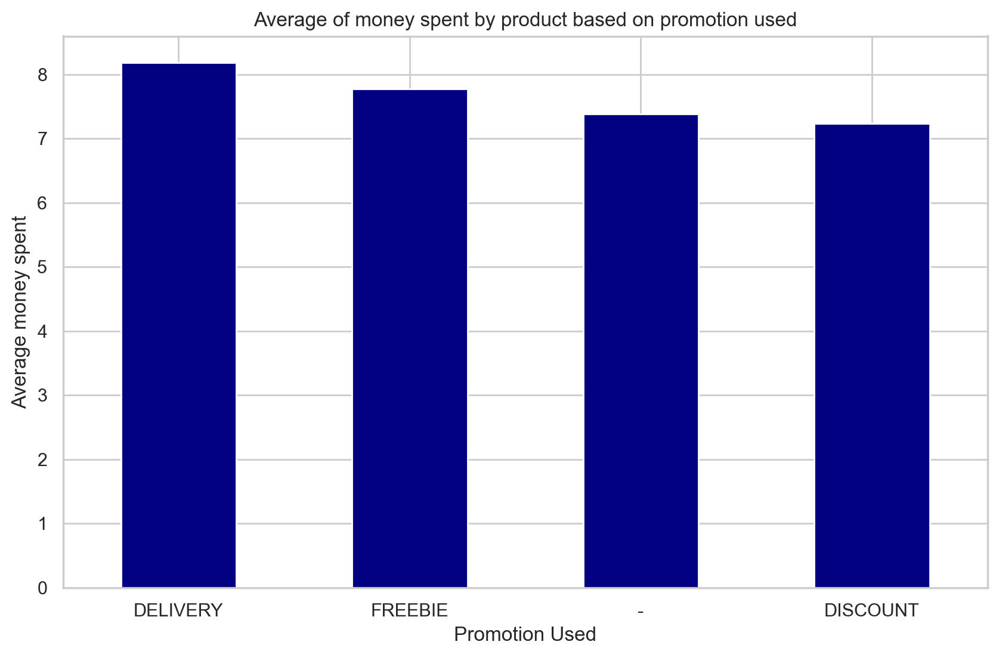

In [92]:
df_grouped = df1.groupby('last_promo')['avg_spent_per_product'].mean().sort_values(ascending=False)


sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))
df_grouped.plot(kind='bar', color='navy')
# Labels
plt.title('Average of money spent by product based on promotion used')
plt.xlabel('Promotion Used')
plt.ylabel('Average money spent')
plt.xticks(rotation=0)  # Rotate x-axis labels horizontally
plt.show()

#### Average spending By Cuisine and Age Group

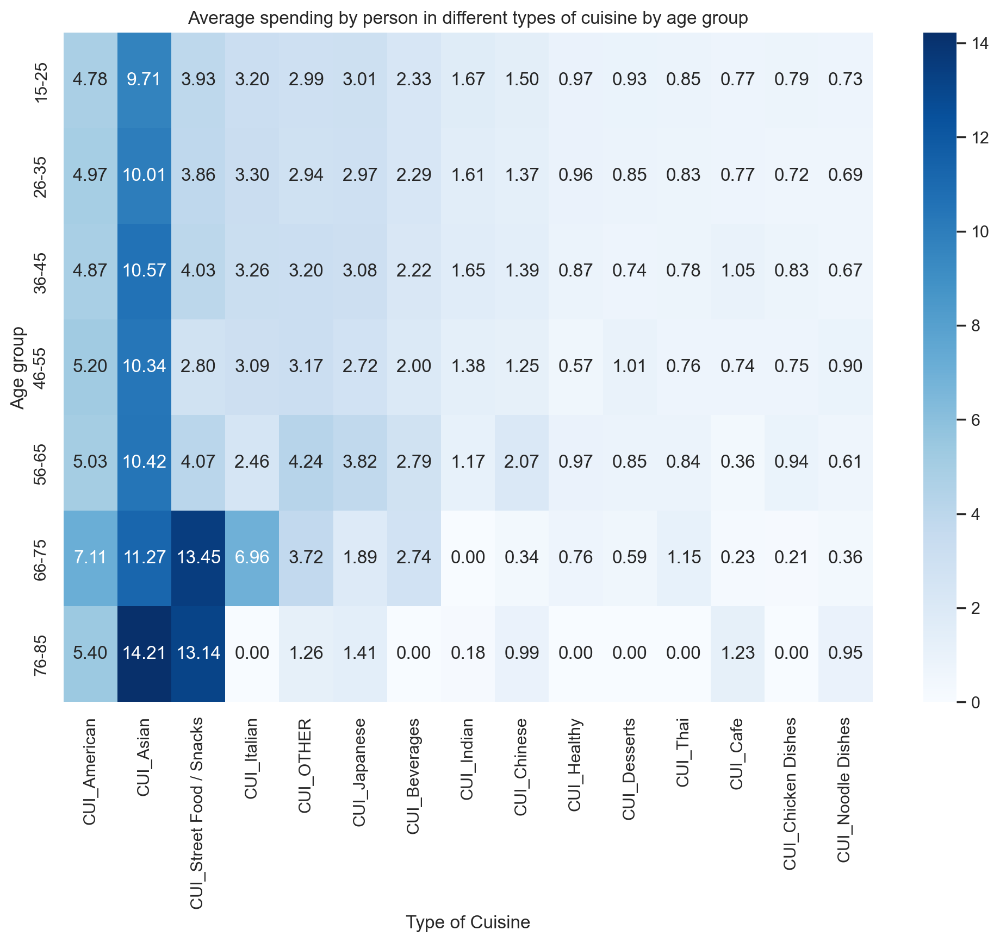

In [95]:

age_cui_spending = df1.groupby('age_group')[CUI].mean()

plt.figure(figsize=(12, 8))
sns.heatmap(age_cui_spending, annot=True, cmap='Blues', fmt='.2f')
plt.title('Average spending by person in different types of cuisine by age group')
plt.ylabel('Age group')
plt.xlabel('Type of Cuisine')
# plt.savefig('Spending on CUI by Age.png')
plt.show()

#### Age Group by Average Spent per Product

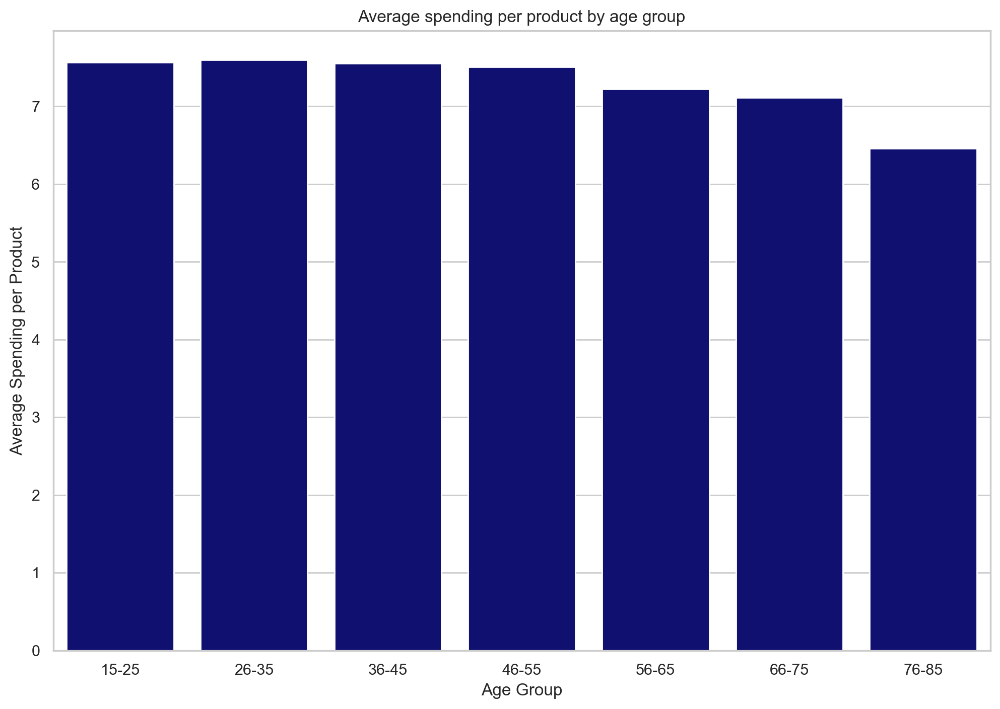

In [93]:
# Calculate the average spending by age group
age_cui_spending = df1.groupby('age_group')['avg_spent_per_product'].mean()


sns.set_style("whitegrid")
# Plotting with a bar chart
plt.figure(figsize=(12, 8))
sns.barplot(x=age_cui_spending.index, y=age_cui_spending.values, color='Navy')
# Labels
plt.title('Average spending per product by age group')
plt.ylabel('Average Spending per Product')
plt.xlabel('Age Group')
plt.xticks(rotation=0)

# Save the figure
plt.show()


#### Age Group by Total Money Spent

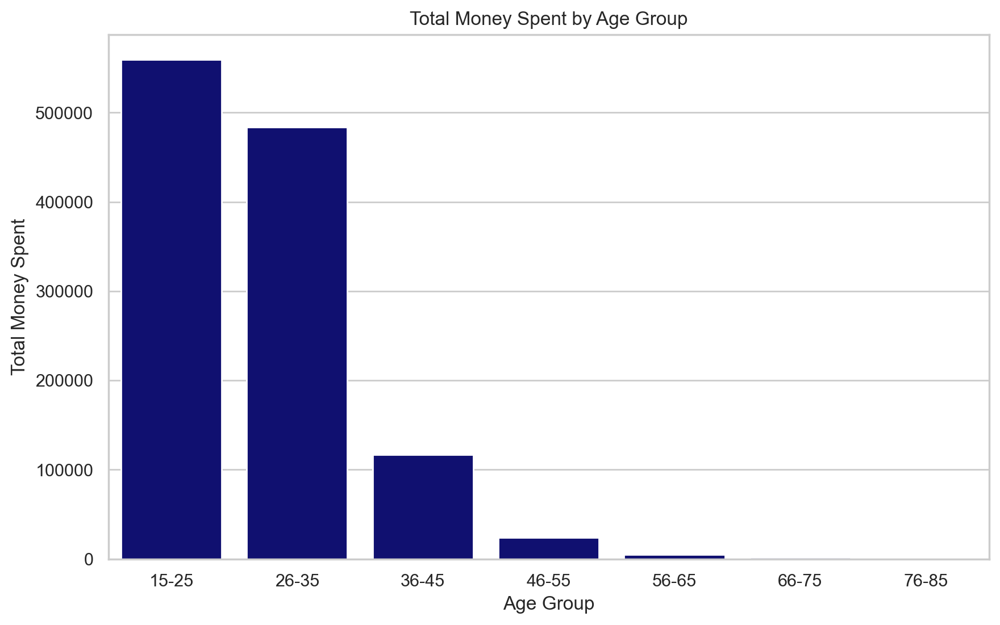

In [94]:
# Group by age group and sum the total money spent
total_money_spent_by_age = df1.groupby('age_group')['Total Money Spent'].sum()


sns.set_style("whitegrid")
# Create the bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=total_money_spent_by_age.index, y=total_money_spent_by_age.values, color='navy')
# Labels
plt.title("Total Money Spent by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Total Money Spent")
plt.xticks(rotation=0)


plt.show()

#### Age Group by Average Money Spent

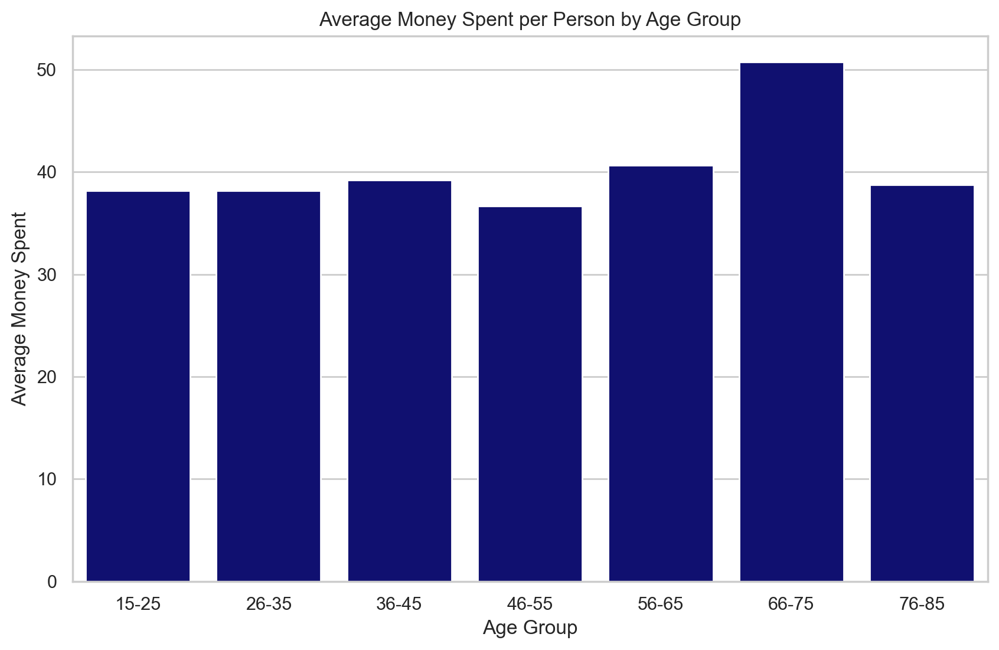

In [95]:
# Count the number of clients in each age group without removing the index
customer_count_by_age = df1.groupby('age_group').size()

# Calculate the average spending per person in each age group
avg_spent_per_person = total_money_spent_by_age / customer_count_by_age


sns.set_style("whitegrid")
# Create the bar plot with the average spending per person
plt.figure(figsize=(10, 6))
sns.barplot(x=avg_spent_per_person.index, y=avg_spent_per_person.values, color='navy')
#Labels
plt.title("Average Money Spent per Person by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Average Money Spent")
plt.xticks(rotation=0)


# Show the graph
plt.show()


#### Proportion of Money Spent per Cuisine and Region

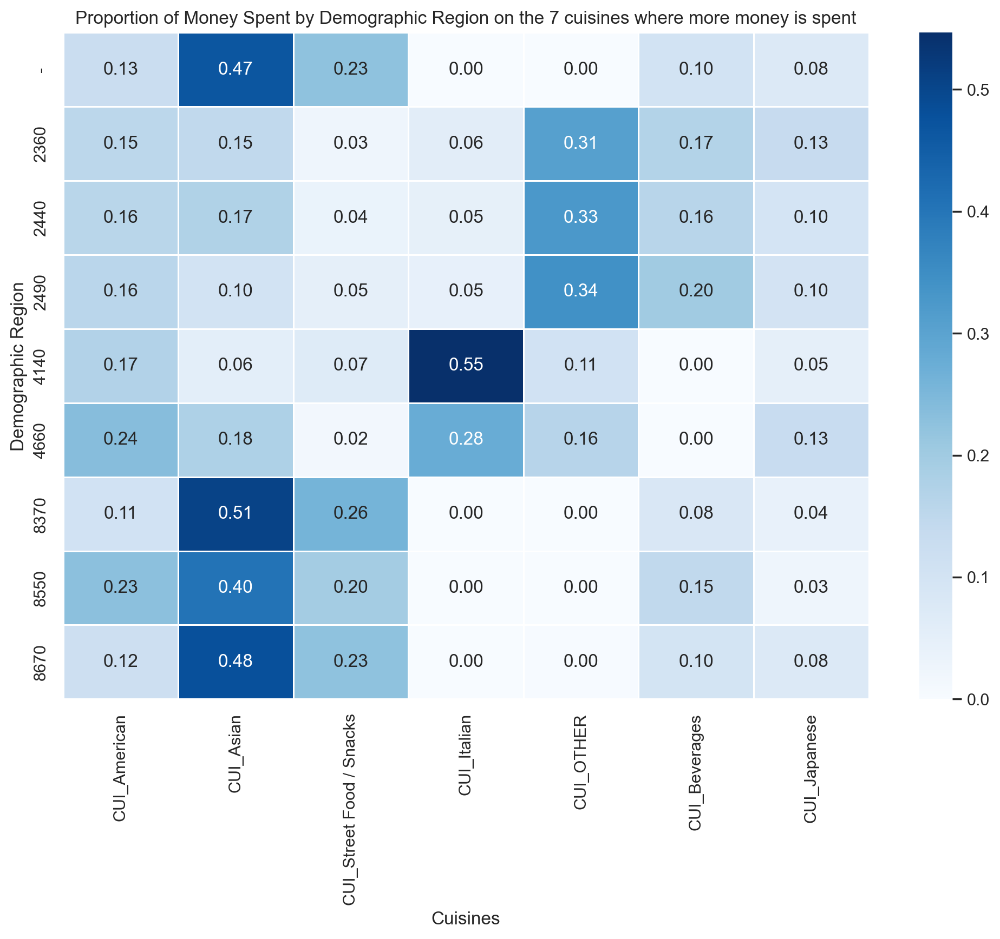

In [96]:

# 7 cuisines where most money was spent 
top7_CUI = ['CUI_American', 'CUI_Asian', 'CUI_Street Food / Snacks', 'CUI_Italian', 'CUI_OTHER', 'CUI_Beverages', 'CUI_Japanese']

# Group the data by region and sum the values for each type of cuisine
df_grouped = df1.groupby('customer_region')[top7_CUI].sum()


df_proporcoes = df_grouped.div(df_grouped.sum(axis=1), axis=0)


plt.figure(figsize=(12, 8))
sns.heatmap(df_proporcoes, annot=True, fmt=".2f", cmap='Blues', linewidths=.5)


plt.title("Proportion of Money Spent by Demographic Region on the 7 cuisines where more money is spent")
plt.xlabel("Cuisines")
plt.ylabel("Demographic Region")
# plt.savefig('Proportion of money spent on each cuisine by demographic region.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

# Asian food is clearly the most popular in several regions, such as 2360, 8370, and 8670, with proportions well above 60%. 
# American food is also relevant in several regions, such as 8550 and 4670, where it competes with Asian food. Cuisines like CUI_Italian, 
# CUI_Healthy, and CUI_Indian seem to be less popular overall, with some exceptions, such as in region 4670, where Italian food has a 
# strong preference.

#### Proportion of Order per Age Group and Time of Day

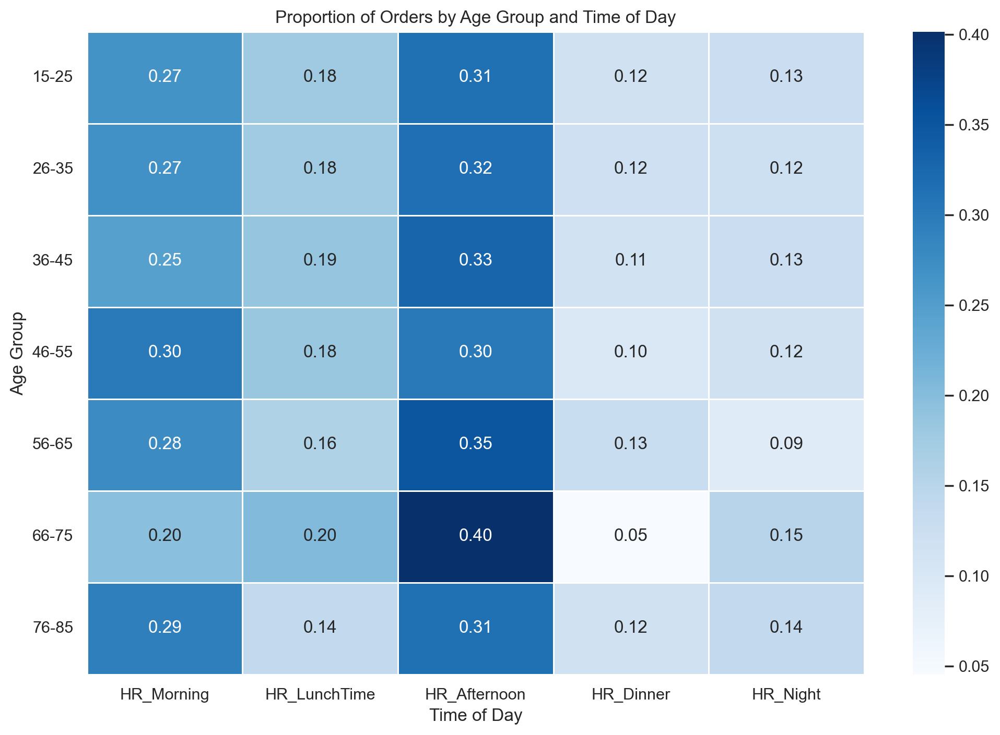

In [97]:
age_time_orders = df1.groupby('age_group')[time_periods].sum()

# Calculate the proportion by row (age group)
age_time_orders_proportion = age_time_orders.div(age_time_orders.sum(axis=1), axis=0)

# Set up the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(age_time_orders_proportion, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5)

# Layout and titles
plt.title('Proportion of Orders by Age Group and Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Age Group')
plt.xticks(rotation=0)
plt.yticks(rotation=0)


plt.show()


#### Proportion of Orders per Region and Time of the Day

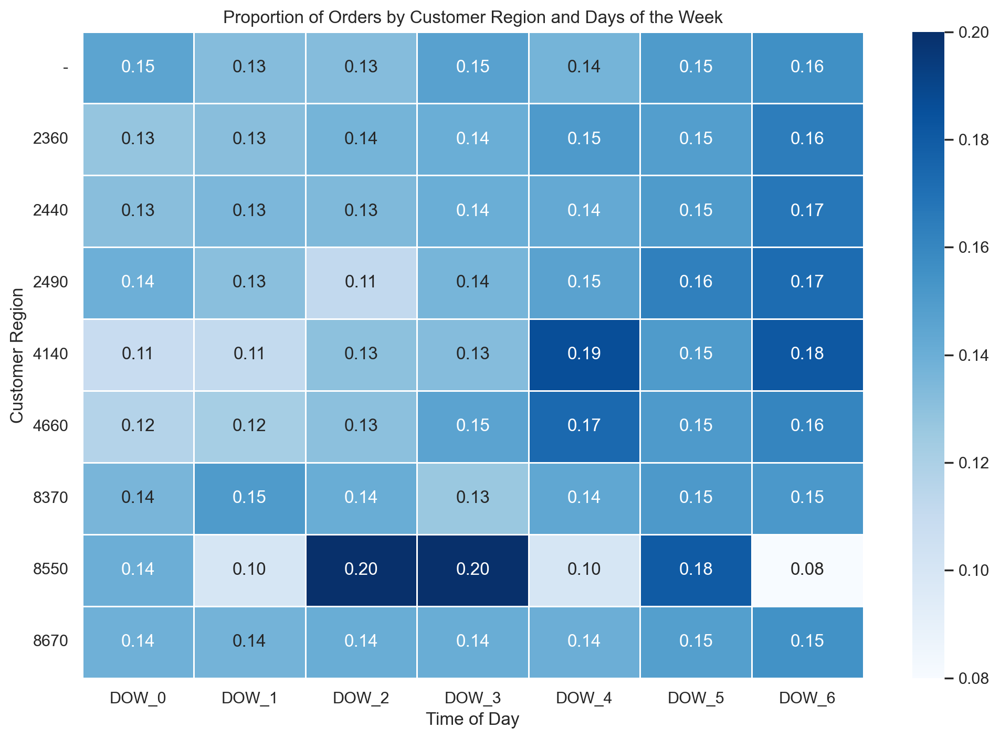

In [98]:
time_periods = ['DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4','DOW_5','DOW_6']
age_time_orders = df.groupby('customer_region')[time_periods].mean()

# Calculate the proportion by row (age group)
age_time_orders_proportion = age_time_orders.div(age_time_orders.sum(axis=1), axis=0)

# Set up the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(age_time_orders_proportion, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5)

# Layout and titles
plt.title('Proportion of Orders by Customer Region and Days of the Week')
plt.xlabel('Time of Day')
plt.ylabel('Customer Region')
plt.xticks(rotation=0)
plt.yticks(rotation=0)


plt.show()

#### Proportion of Order per Region and Period of the Day

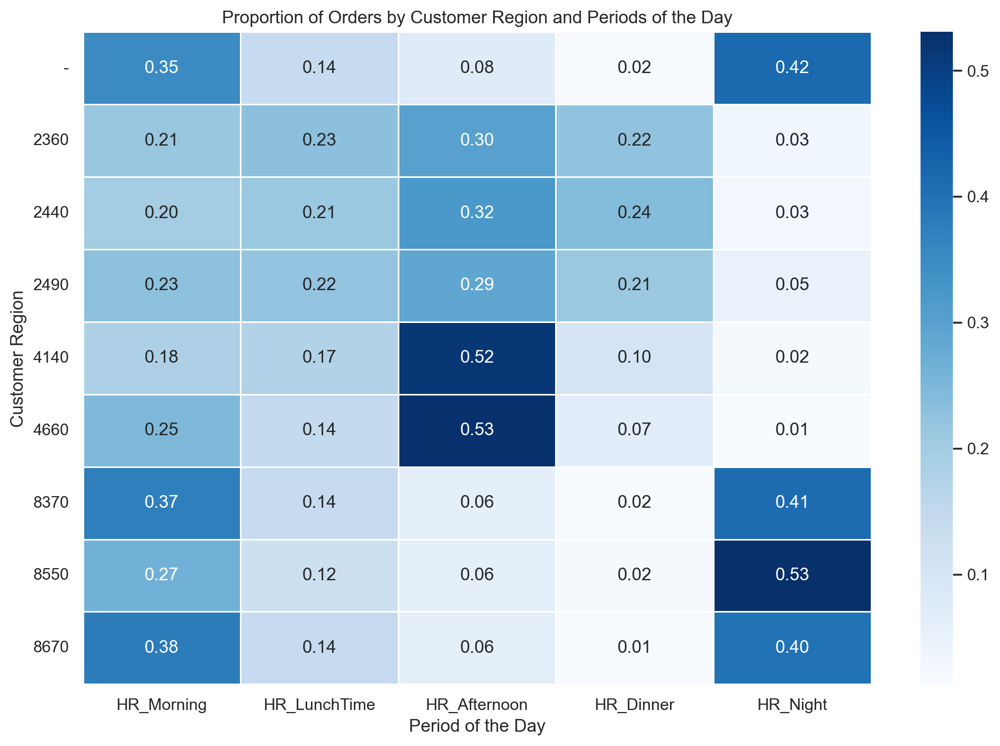

In [99]:
# Calculate the total number of orders by age group and time of day
time_periods = ['HR_Morning', 'HR_LunchTime', 'HR_Afternoon', 'HR_Dinner', 'HR_Night']
age_time_orders = df1.groupby('customer_region')[time_periods].mean()

# Calculate the proportion by row (age group)
age_time_orders_proportion = age_time_orders.div(age_time_orders.sum(axis=1), axis=0)

# Set up the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(age_time_orders_proportion, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5)

# Layout and titles
plt.title('Proportion of Orders by Customer Region and Periods of the Day')
plt.xlabel('Period of the Day')
plt.ylabel('Customer Region')
plt.xticks(rotation=0)
plt.yticks(rotation=0)


plt.show()

#### Proportion of Customers per region and cuisine

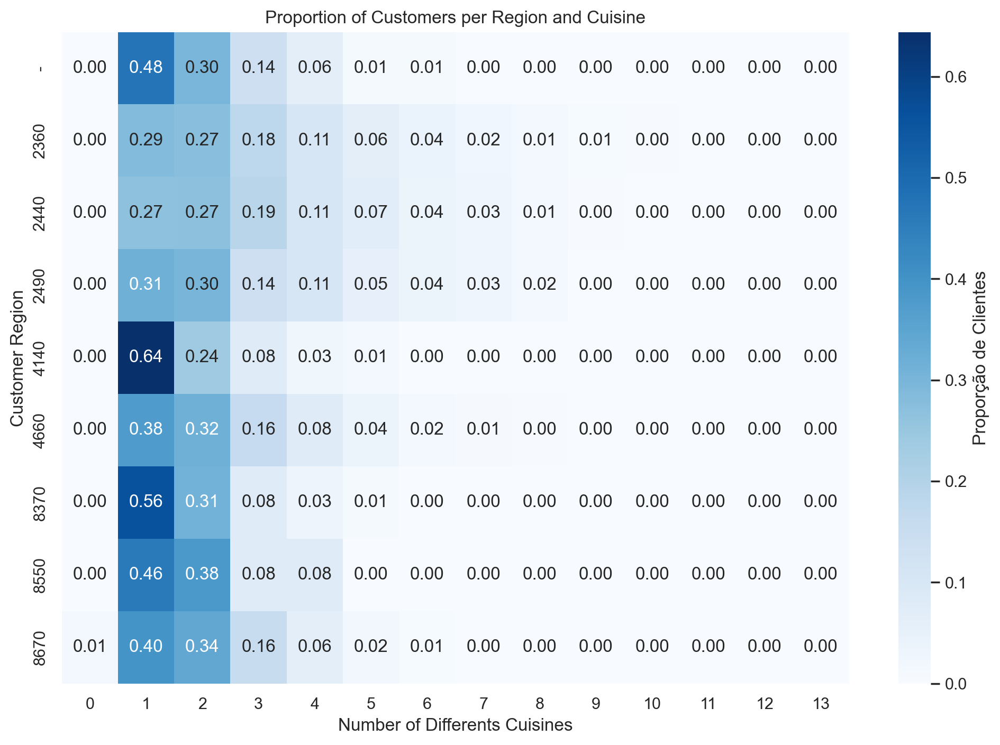

In [100]:
heatmap_data = df1.groupby(['customer_region', 'different_CUI']).size().unstack(fill_value=0)

# Convert to proportions by row
heatmap_data = heatmap_data.div(heatmap_data.sum(axis=1), axis=0)

# Create the heatmap with the 'Blues' palette
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="Blues", cbar_kws={'label': 'Proporção de Clientes'})

# Graph settings 
plt.xlabel('Number of Differents Cuisines')
plt.ylabel('Customer Region')
plt.title('Proportion of Customers per Region and Cuisine')
plt.show()

#### Proportion of Last orders where Promotion was used across Hours by Meal

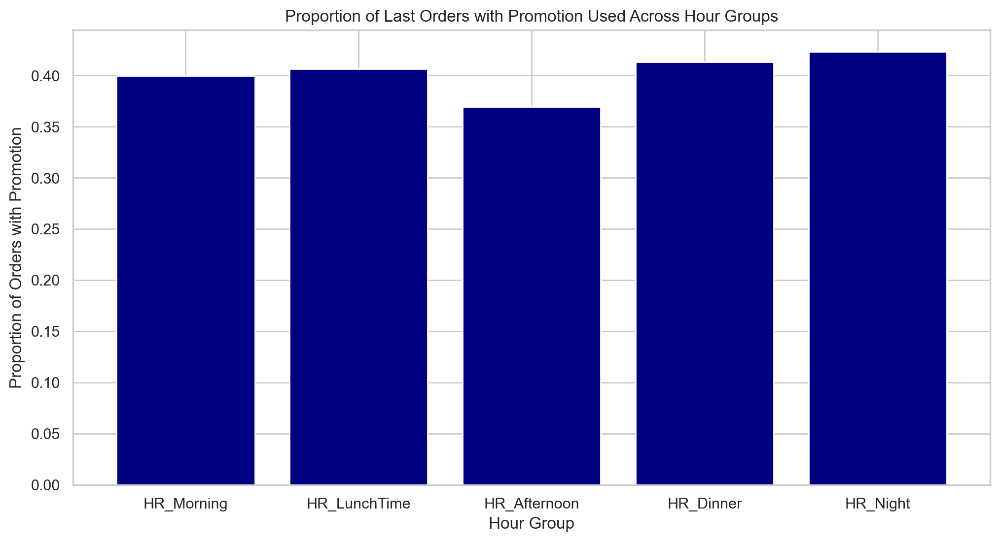

In [101]:
# Calculate the total count of orders for each hour group
total_counts_by_hour = df1[hours_group].sum()
    
# Calculate the count of orders with a promotion used in each hour group
promo_counts_by_hour = df1[df1['promo_used'] == 1][hours_group].sum()

# Calculate the proportion of orders with a promotion for each hour group
promo_proportion_by_hour = promo_counts_by_hour / total_counts_by_hour

# Plot the results
sns.set_style("whitegrid")

plt.figure(figsize=(12, 6))
promo_proportion_by_hour.plot(kind='bar', width=0.8, color="navy")
plt.title("Proportion of Last Orders with Promotion Used Across Hour Groups")
# Labels
plt.xlabel("Hour Group")
plt.ylabel("Proportion of Orders with Promotion")
plt.xticks(rotation=0)

plt.show()


#### Proportion of last orders with promotion across Cuisine Types

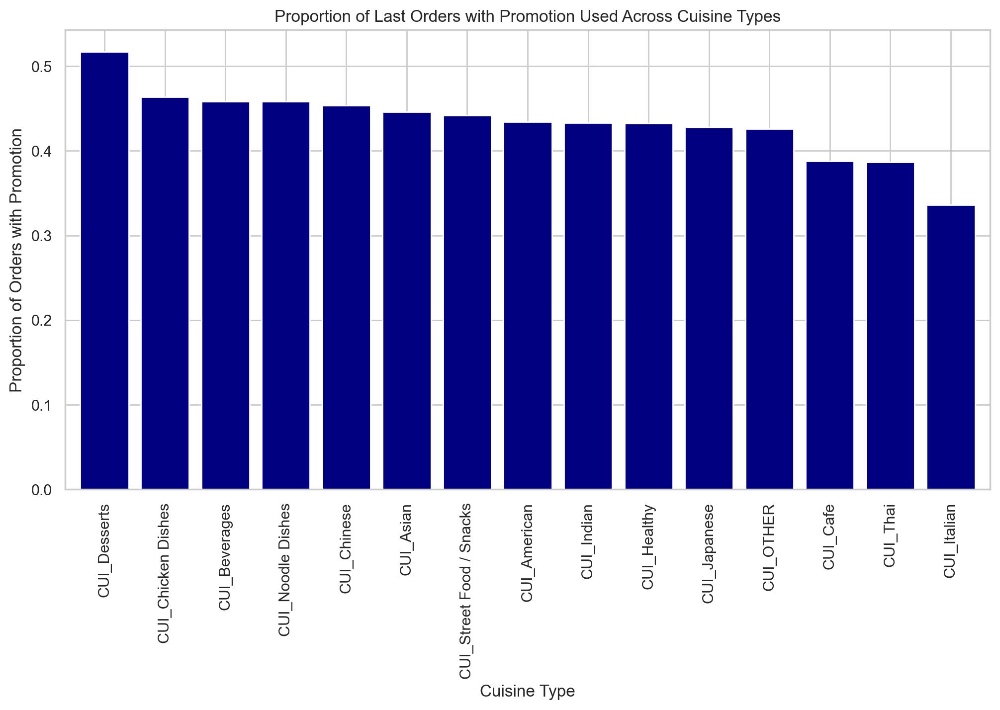

In [102]:
# Calculate the total count of orders for each cuisine type
total_counts_by_cuisine = (df1[CUI] > 0).sum()

# Calculate the count of orders with a promotion used for each cuisine type
promo_counts_by_cuisine = (df1[df1['promo_used'] == 1][CUI] > 0).sum()

# Calculate the proportion of orders with a promotion for each cuisine type and sort in descending order
promo_proportion_by_cuisine = (promo_counts_by_cuisine / total_counts_by_cuisine).sort_values(ascending=False)

# Plot the results
plt.figure(figsize=(12, 6))
promo_proportion_by_cuisine.plot(kind='bar', width=0.8, color='Navy')
plt.title("Proportion of Last Orders with Promotion Used Across Cuisine Types")
#Labels
plt.xlabel("Cuisine Type")
plt.ylabel("Proportion of Orders with Promotion")
plt.xticks(rotation=90)

plt.show()


#### Peak_hours and Off_peak_hours across customer region

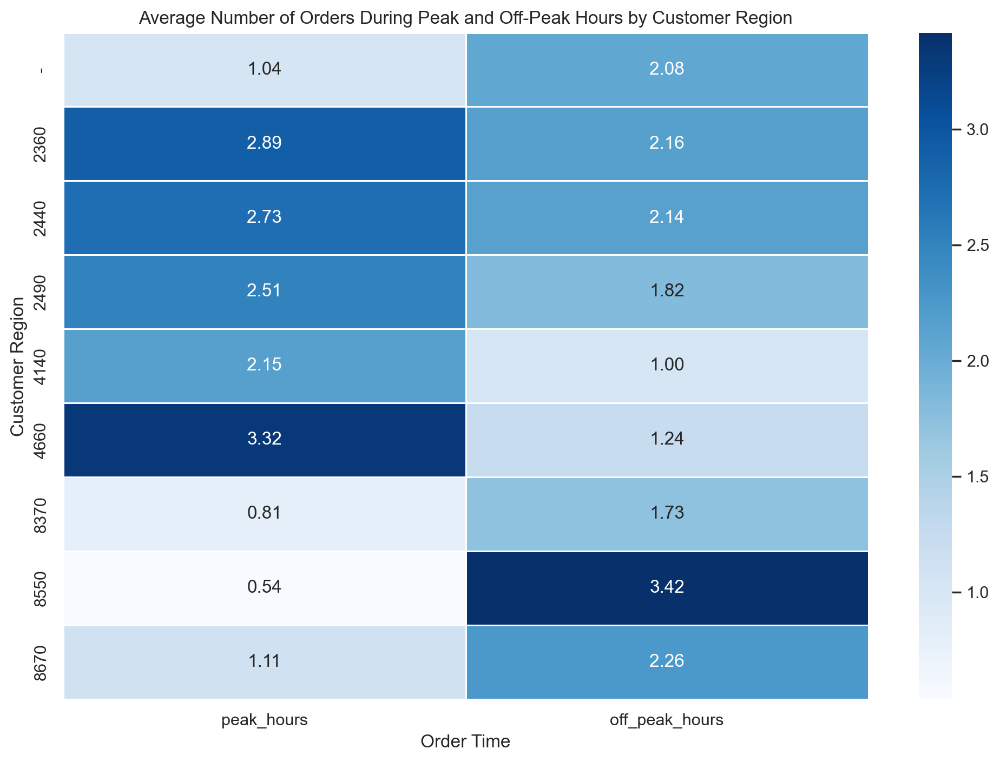

In [103]:
region_peak_offpeak = df1.groupby('customer_region')[['peak_hours', 'off_peak_hours']].mean()

# Basic process...
plt.figure(figsize=(12, 8))
sns.heatmap(region_peak_offpeak, annot=True, fmt=".2f", cmap="Blues", linewidths=0.5)
plt.title("Average Number of Orders During Peak and Off-Peak Hours by Customer Region")
#Labels
plt.xlabel("Order Time")
plt.ylabel("Customer Region")
plt.show()

#### Peak_hours and Off_peak_hours across Age Groups

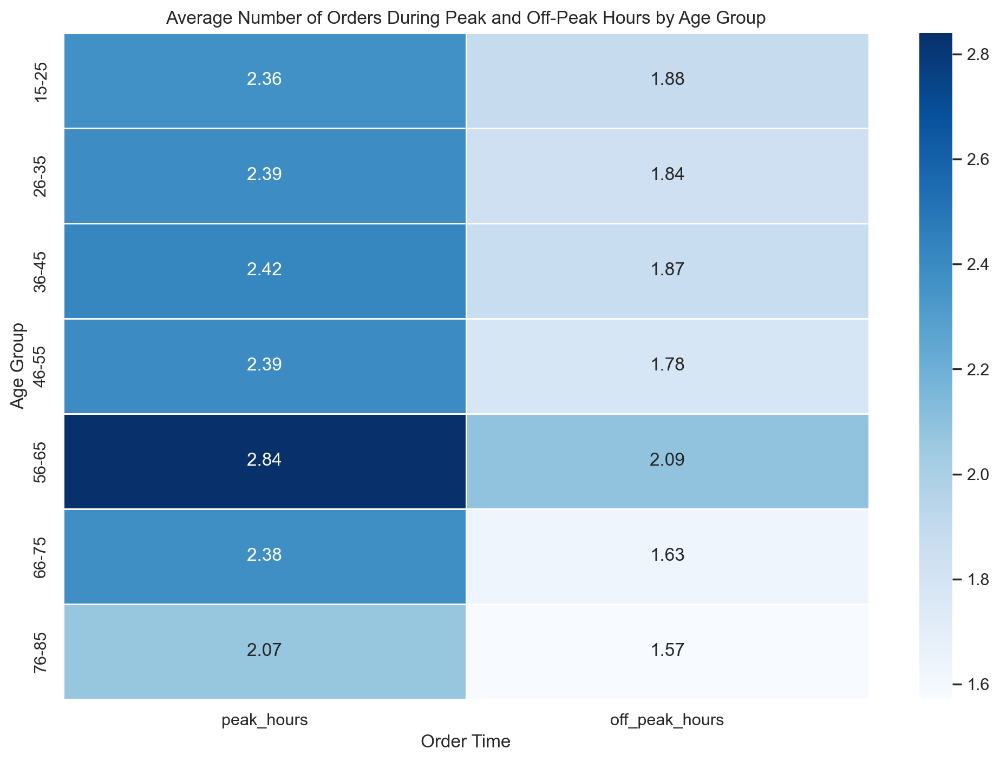

In [104]:
# Calculate the average number of peak and off-peak orders for each age group
age_peak_offpeak = df1.groupby('age_group')[['peak_hours', 'off_peak_hours']].mean()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(age_peak_offpeak, annot=True, fmt=".2f", cmap="Blues", linewidths=0.5)
plt.title("Average Number of Orders During Peak and Off-Peak Hours by Age Group")
#Labels
plt.xlabel("Order Time")
plt.ylabel("Age Group")
plt.show()


#### Average Spent per Product by Customer Region

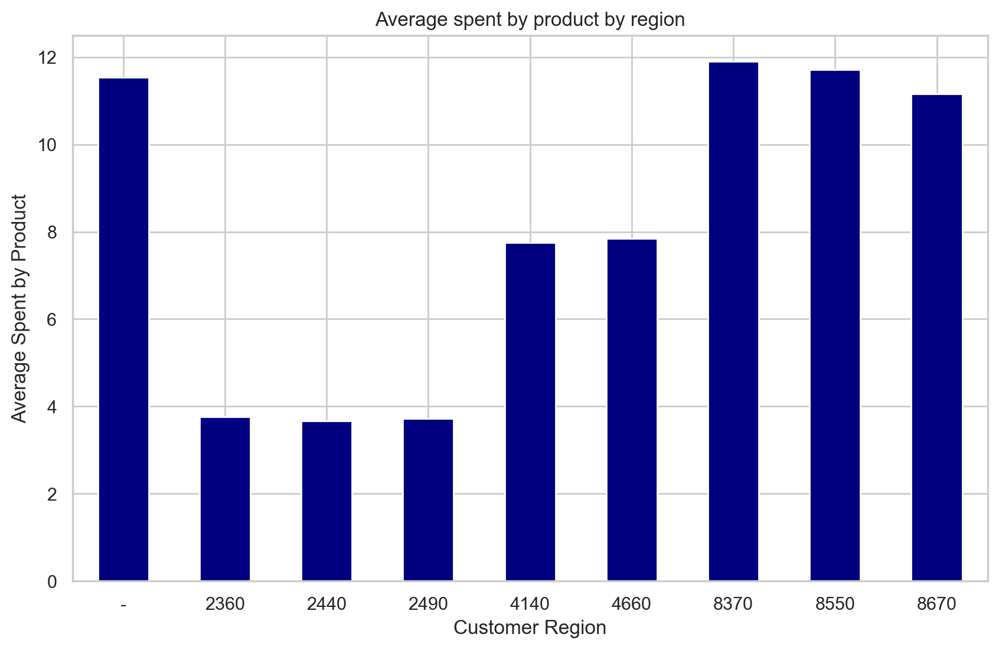

In [105]:
avg_spent_per_region = df1.groupby('customer_region')['avg_spent_per_product'].mean()


sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))
avg_spent_per_region.plot(kind='bar', color='Navy')
# Labels and Title
plt.xlabel('Customer Region')
plt.ylabel('Average Spent by Product')
plt.title('Average spent by product by region')
plt.xticks(rotation=0)
plt.show()



<a class="anchor" id = "categorical-categorical-cross-tabulations">

### 2.3.3. Categorical-Categorical: Cross-tabulations

In [190]:
from scipy.stats import chi2_contingency

# Get the column names from non_metric_features
non_metric_columns = non_metric_features.columns

for i in range(len(non_metric_columns)):
    for j in range(i + 1, len(non_metric_columns)):
        cat_var = non_metric_columns[i]
        cat_var2 = non_metric_columns[j]
        contingency_table = pd.crosstab(df1[cat_var], df1[cat_var2])  # Create contingency table
        chi2, p, dof, expected = chi2_contingency(contingency_table)   # Perform Chi-square test
        display(contingency_table)
        print(f"Chi-square Test of Independence for {cat_var} and {cat_var2}: p-value = {p}")

last_promo,-,DELIVERY,DISCOUNT,FREEBIE
customer_region,,,,
-,208,97,70,67
2360,4401,1859,1371,1198
2440,756,284,244,199
2490,217,100,72,56
4140,502,154,110,91
4660,5583,1573,1292,1102
8370,256,114,57,68
8550,4,4,0,5
8670,4817,2097,1280,1567


Chi-square Test of Independence for customer_region and last_promo: p-value = 2.329313143673263e-51


payment_method,CARD,CASH,DIGI
customer_region,,,
-,270,73,99
2360,5424,1743,1662
2440,904,278,301
2490,287,80,78
4140,571,148,138
4660,6443,1489,1618
8370,291,84,120
8550,8,2,3
8670,5955,1727,2079


Chi-square Test of Independence for customer_region and payment_method: p-value = 1.3621070070723855e-24


age_group,15-25,26-35,36-45,46-55,56-65,66-75,76-85
customer_region,,,,,,,
-,212,183,38,7,0,0,0
2360,4080,3508,787,175,38,10,5
2440,656,611,138,38,5,1,0
2490,212,178,39,8,1,0,0
4140,384,344,90,15,2,0,0
4660,4375,3797,925,184,36,9,4
8370,224,195,50,11,2,1,0
8550,7,6,0,0,0,0,0
8670,4515,3864,907,206,29,11,5


Chi-square Test of Independence for customer_region and age_group: p-value = 0.9989769883857196


promo_used,0,1
customer_region,,
-,208,234
2360,4401,4428
2440,756,727
2490,217,228
4140,502,355
4660,5583,3967
8370,256,239
8550,4,9
8670,4817,4944


Chi-square Test of Independence for customer_region and promo_used: p-value = 4.925413278361289e-44


payment_method,CARD,CASH,DIGI
last_promo,,,
-,11428,2419,2897
DELIVERY,3333,1523,1426
DISCOUNT,2683,919,894
FREEBIE,2709,763,881


Chi-square Test of Independence for last_promo and payment_method: p-value = 1.590726225078999e-110


age_group,15-25,26-35,36-45,46-55,56-65,66-75,76-85
last_promo,,,,,,,
-,7664,6635,1593,334,69,19,10
DELIVERY,3013,2424,560,132,14,3,3
DISCOUNT,2016,1820,431,96,17,6,1
FREEBIE,1972,1807,390,82,13,4,0


Chi-square Test of Independence for last_promo and age_group: p-value = 0.06391152673372895


promo_used,0,1
last_promo,,
-,16744,0
DELIVERY,0,6282
DISCOUNT,0,4496
FREEBIE,0,4353


Chi-square Test of Independence for last_promo and promo_used: p-value = 0.0


age_group,15-25,26-35,36-45,46-55,56-65,66-75,76-85
payment_method,,,,,,,
CARD,9293,7989,1901,402,65,17,12
CASH,2589,2264,494,122,21,11,0
DIGI,2783,2433,579,120,27,4,2


Chi-square Test of Independence for payment_method and age_group: p-value = 0.20688404786779543


promo_used,0,1
payment_method,,
CARD,11428,8725
CASH,2419,3205
DIGI,2897,3201


Chi-square Test of Independence for payment_method and promo_used: p-value = 4.263205789812783e-89


promo_used,0,1
age_group,,
15-25,7664,7001
26-35,6635,6051
36-45,1593,1381
46-55,334,310
56-65,69,44
66-75,19,13
76-85,10,4


Chi-square Test of Independence for age_group and promo_used: p-value = 0.24636209756303828


This code is testing whether each pair of categorical features (columns) in non_metric_features are statistically independent or not. 
If the p-value is low (typically below a significance level of 0.05), it suggests that the two variables are not independent, meaning there is a statistically significant association between them.

#### Payment Methods by Customer Region

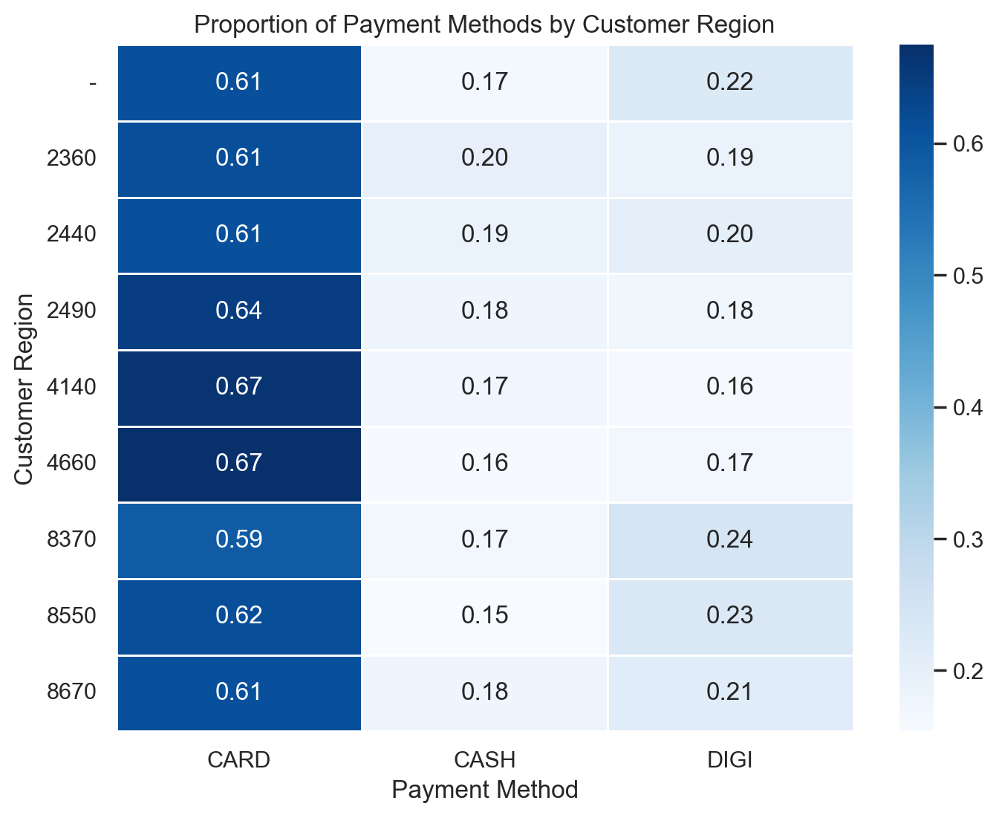

In [191]:
# Create a contingency table with row-wise normalization
contingency_table_proportion = pd.crosstab(df1['customer_region'], df1['payment_method'], normalize='index')

# Plot the heatmap with proportions
plt.figure(figsize=(8, 6))
sns.heatmap(contingency_table_proportion, annot=True, fmt=".2f", cmap="Blues", linewidths=0.5)
plt.title("Proportion of Payment Methods by Customer Region")
#Labels
plt.xlabel("Payment Method")
plt.ylabel("Customer Region")
plt.yticks(rotation=0)

plt.show()



#### Last Promo Used by Customer Region

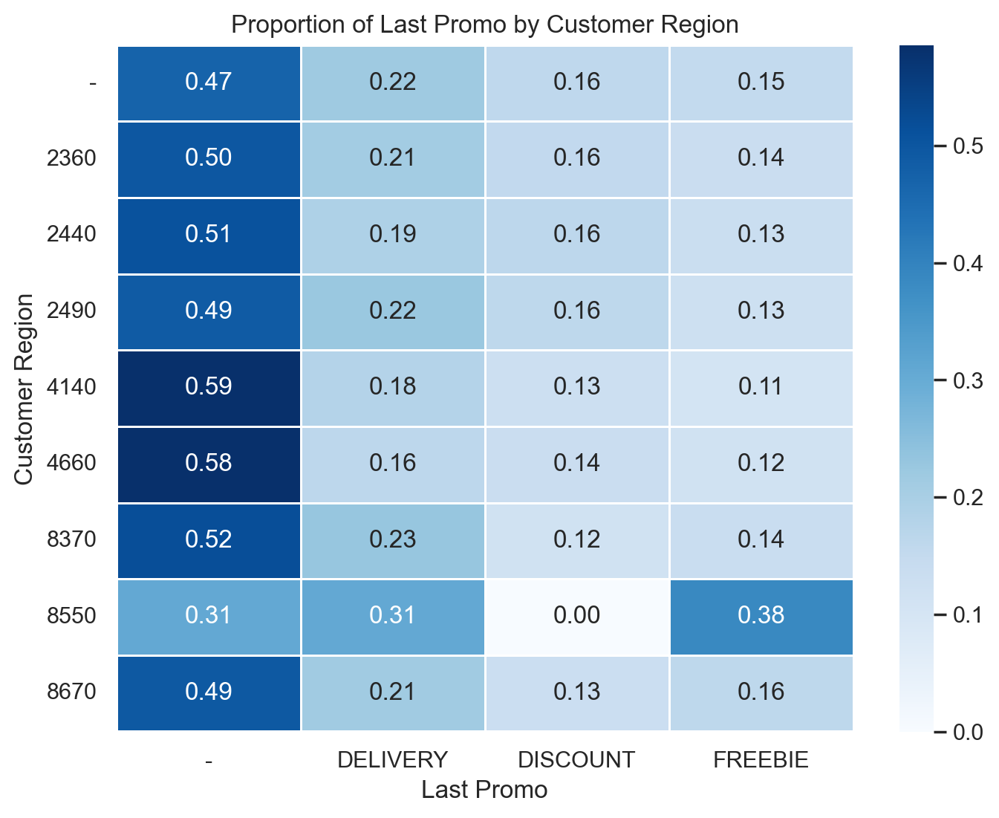

In [192]:
contingency_table_proportion = pd.crosstab(df1['customer_region'], df1['last_promo'], normalize='index')

# Plotting the heatmap with our proportions
plt.figure(figsize=(8, 6))
sns.heatmap(contingency_table_proportion, annot=True, fmt=".2f", cmap="Blues", linewidths=0.5)
plt.title("Proportion of Last Promo by Customer Region")
#Labels
plt.xlabel("Last Promo")
plt.ylabel("Customer Region")
plt.yticks(rotation=0)

plt.show()


#### Promo Usage by Customer Region

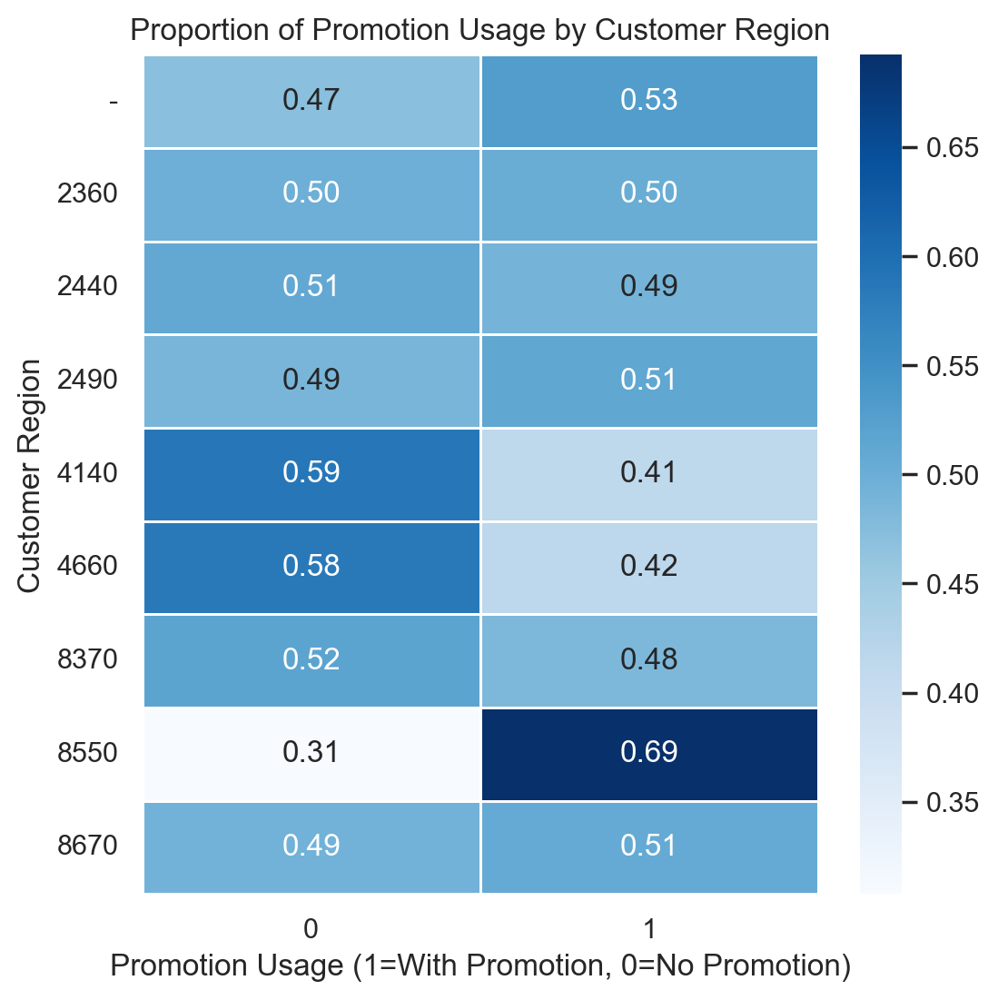

In [ ]:
# Create a contingency table with row-wise normalization for customer_region and promo_numeric
contingency_table_proportion = pd.crosstab(df1['customer_region'], df1['promo_used'], normalize='index')

# Plot the heatmap with proportions
plt.figure(figsize=(6, 6))
sns.heatmap(contingency_table_proportion, annot=True, fmt=".2f", cmap="Blues", linewidths=0.5)
# Labels
plt.title("Proportion of Promotion Usage by Customer Region")
plt.xlabel("Promotion Usage (1=With Promotion, 0=No Promotion)")
plt.ylabel("Customer Region")
plt.yticks(rotation=0)
plt.show()


#### Age groups by Customer Region

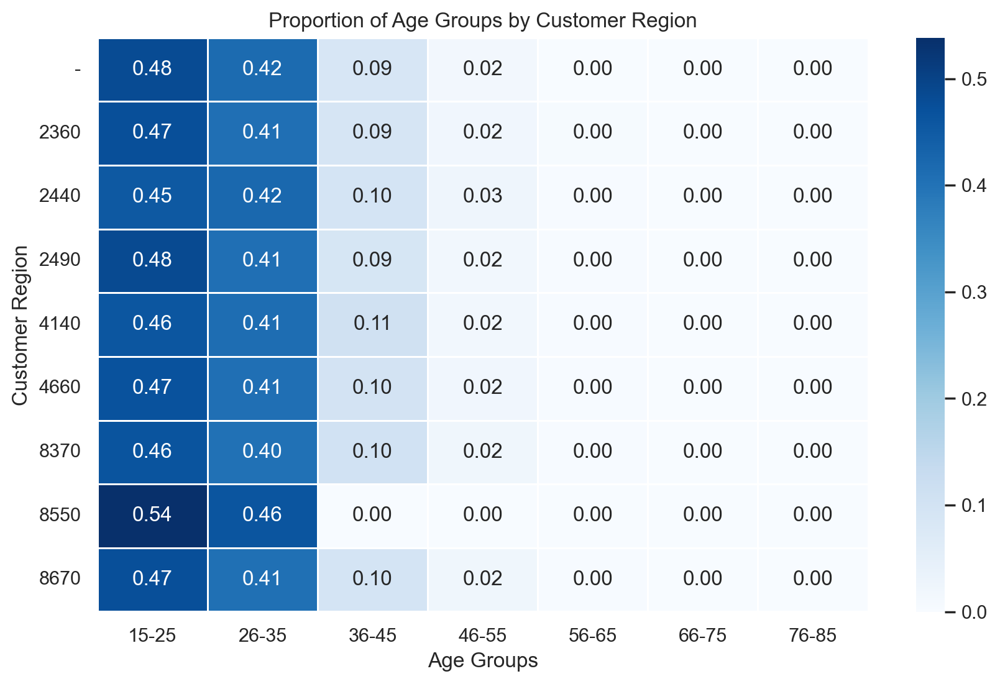

In [ ]:
# Create a contingency table with row-wise normalization for customer_region and promo_numeric
contingency_table_proportion = pd.crosstab(df1['customer_region'], df1['age_group'], normalize='index')

# Plot the heatmap with proportions
plt.figure(figsize=(10,6))
sns.heatmap(contingency_table_proportion, annot=True, fmt=".2f", cmap="Blues", linewidths=0.5)
# Labels
plt.title("Proportion of Age Groups by Customer Region")
plt.xlabel("Age Groups")
plt.ylabel("Customer Region")
plt.yticks(rotation=0)
plt.show()

#### Payment Methods by Age Groups

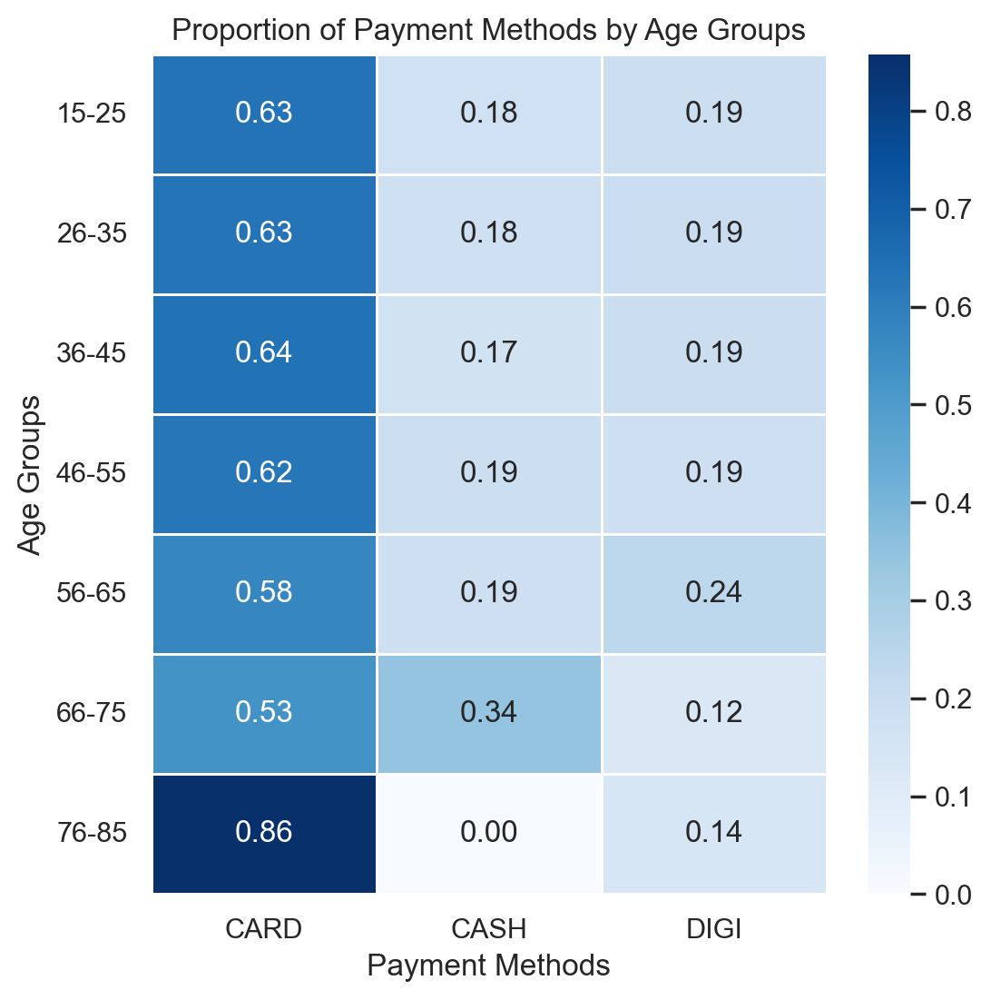

In [ ]:
contingency_table_proportion = pd.crosstab(df1['age_group'], df1['payment_method'], normalize='index')

# Plot the heatmap with proportions
plt.figure(figsize=(6, 6))
sns.heatmap(contingency_table_proportion, annot=True, fmt=".2f", cmap="Blues", linewidths=0.5)
# Labels
plt.title("Proportion of Payment Methods by Age Groups")
plt.xlabel("Payment Methods")
plt.ylabel("Age Groups")
plt.yticks(rotation=0)
plt.show()

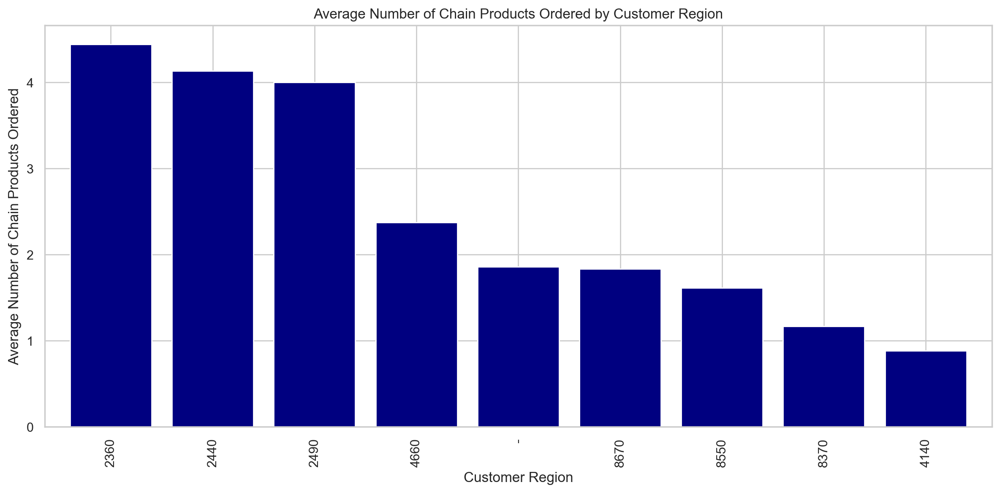

In [ ]:
# Calculate the average number of chain products ordered for each region
chain_by_region = df1.groupby('customer_region')['is_chain'].mean()


sns.set_style("whitegrid")
# Plot the results
plt.figure(figsize=(12, 6))
chain_by_region.sort_values(ascending=False).plot(kind='bar', width=0.8, color="navy")
# Labels
plt.title("Average Number of Chain Products Ordered by Customer Region")
plt.xlabel("Customer Region")
plt.ylabel("Average Number of Chain Products Ordered")
plt.xticks(rotation=90)

plt.show()